## Fine-tune SegFormer on a custom dataset

In this notebook, we are going to fine-tune [SegFormerForSemanticSegmentation](https://huggingface.co/docs/transformers/main/model_doc/segformer#transformers.SegformerForSemanticSegmentation) on a custom **semantic segmentation** dataset. In semantic segmentation, the goal for the model is to label each pixel of an image with one of a list of predefined classes.

We load the encoder of the model with weights pre-trained on ImageNet-1k, and fine-tune it together with the decoder head, which starts with randomly initialized weights.

In [17]:
!pip install transformers datasets evaluate torch torchvision huggingface_hub --upgrade

## Download toy dataset

Here we download a small subset of the ADE20k dataset, which is an important benchmark for semantic segmentation. It contains 150 labels.

I've made a small subset just for demonstration purposes (namely the 10 first training and 10 first validation images + segmentation maps). The goal for the model is to overfit this tiny dataset (because that makes sure that it'll work on a larger scale).

In [2]:
import requests, zipfile, io

def download_data():
    url = "https://www.dropbox.com/s/l1e45oht447053f/ADE20k_toy_dataset.zip?dl=1"
    r = requests.get(url)
    z = zipfile.ZipFile(io.BytesIO(r.content))
    z.extractall()

download_data()

Note that this dataset is now also available on the hub :) you can directly check out the images [in your browser](scene_parse_150)! It can be easily loaded as follows (note that loading will take some time as the dataset is several GB's large):

In [13]:
from datasets import load_dataset

load_entire_dataset = False

if load_entire_dataset:
  dataset = load_dataset("scene_parse_150")

## Define PyTorch dataset and dataloaders

Here we define a [custom PyTorch dataset](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html). Each item of the dataset consists of an image and a corresponding segmentation map.

In [14]:
from torch.utils.data import Dataset
import os
from PIL import Image

class SemanticSegmentationDataset(Dataset):
    """Image (semantic) segmentation dataset."""

    def __init__(self, root_dir, image_processor, train=True):
        """
        Args:
            root_dir (string): Root directory of the dataset containing the images + annotations.
            image_processor (SegFormerImageProcessor): image processor to prepare images + segmentation maps.
            train (bool): Whether to load "training" or "validation" images + annotations.
        """
        self.root_dir = root_dir
        self.image_processor = image_processor
        self.train = train

        sub_path = "training" if self.train else "validation"
        self.img_dir = os.path.join(self.root_dir, "images", sub_path)
        self.ann_dir = os.path.join(self.root_dir, "annotations", sub_path)

        # read images
        image_file_names = []
        for root, dirs, files in os.walk(self.img_dir):
          image_file_names.extend(files)
        self.images = sorted(image_file_names)

        # read annotations
        annotation_file_names = []
        for root, dirs, files in os.walk(self.ann_dir):
          annotation_file_names.extend(files)
        self.annotations = sorted(annotation_file_names)

        assert len(self.images) == len(self.annotations), "There must be as many images as there are segmentation maps"

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):

        image = Image.open(os.path.join(self.img_dir, self.images[idx]))
        segmentation_map = Image.open(os.path.join(self.ann_dir, self.annotations[idx]))

        # randomly crop + pad both image and segmentation map to same size
        encoded_inputs = self.image_processor(image, segmentation_map, return_tensors="pt")

        for k,v in encoded_inputs.items():
          encoded_inputs[k].squeeze_() # remove batch dimension

        return encoded_inputs

Let's initialize the training + validation datasets. Important: we initialize the image processor with `reduce_labels=True`, as the classes in ADE20k go from 0 to 150, with 0 meaning "background". However, we want the labels to go from 0 to 149, and only train the model to recognize the 150 classes (which don't include "background"). Hence, we'll reduce all labels by 1 and replace 0 by 255, which is the `ignore_index` of SegFormer's loss function.

In [12]:
from transformers import SegformerImageProcessor

root_dir = './ADE20k_toy_dataset'
image_processor = SegformerImageProcessor(reduce_labels=True)

train_dataset = SemanticSegmentationDataset(root_dir=root_dir, image_processor=image_processor)
valid_dataset = SemanticSegmentationDataset(root_dir=root_dir, image_processor=image_processor, train=False)

In [4]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(valid_dataset))

Number of training examples: 10
Number of validation examples: 10


Let's verify a random example:

In [6]:
encoded_inputs = train_dataset[0]

In [7]:
encoded_inputs["pixel_values"].shape

torch.Size([3, 512, 512])

In [8]:
encoded_inputs["labels"].shape

torch.Size([512, 512])

In [9]:
encoded_inputs["labels"]

tensor([[255, 255, 255,  ...,   5,   5,   5],
        [255,   5,   5,  ...,   5,   5,   5],
        [255,   5,   5,  ...,   5,   5,   5],
        ...,
        [  3,   3,   3,  ...,   0,   0, 255],
        [  3,   3,   3,  ...,   0,   0, 255],
        [  3,   3,   3,  ...,   0,   0,   0]])

In [10]:
encoded_inputs["labels"].squeeze().unique()

tensor([  0,   3,   4,   5,  12,  17,  31,  32,  42,  43,  87,  96, 104, 125,
        138, 149, 255])

Next, we define corresponding dataloaders.

In [11]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True)
valid_dataloader = DataLoader(valid_dataset, batch_size=2)

In [12]:
batch = next(iter(train_dataloader))

In [13]:
for k,v in batch.items():
  print(k, v.shape)

pixel_values torch.Size([2, 3, 512, 512])
labels torch.Size([2, 512, 512])


In [14]:
batch["labels"].shape

torch.Size([2, 512, 512])

In [15]:
mask = (batch["labels"] != 255)
mask

tensor([[[False,  True,  True,  ...,  True,  True, False],
         [ True,  True,  True,  ...,  True,  True, False],
         [ True,  True,  True,  ...,  True,  True, False],
         ...,
         [False, False,  True,  ...,  True, False, False],
         [False, False,  True,  ...,  True, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False,  True,  ...,  True, False, False],
         [ True,  True,  True,  ...,  True,  True, False],
         [ True,  True,  True,  ...,  True,  True, False],
         ...,
         [False,  True,  True,  ...,  True,  True, False],
         [False,  True,  True,  ...,  True,  True, False],
         [False, False, False,  ..., False, False, False]]])

In [16]:
batch["labels"][mask]

tensor([0, 0, 0,  ..., 0, 0, 0])

## Define the model

Here we load the model, and equip the encoder with weights pre-trained on ImageNet-1k (we take the smallest variant, `nvidia/mit-b0` here, but you can take a bigger one like `nvidia/mit-b5` from the [hub](https://huggingface.co/models?other=segformer)). We also set the `id2label` and `label2id` mappings, which will be useful when performing inference.

In [18]:
from transformers import SegformerForSemanticSegmentation
import json
from huggingface_hub import hf_hub_download

# load id2label mapping from a JSON on the hub
repo_id = "huggingface/label-files"
filename = "ade20k-id2label.json"
id2label = json.load(open(hf_hub_download(repo_id=repo_id, filename=filename, repo_type="dataset"), "r"))
id2label = {int(k): v for k, v in id2label.items()}
label2id = {v: k for k, v in id2label.items()}

# define model
model = SegformerForSemanticSegmentation.from_pretrained("nvidia/mit-b0",
                                                         num_labels=150,
                                                         id2label=id2label,
                                                         label2id=label2id,
)

ade20k-id2label.json:   0%|          | 0.00/2.81k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/70.0k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/14.4M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head.batch_norm.bias', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.batch_norm.running_mean', 'decode_head.batch_norm.running_var', 'decode_head.batch_norm.weight', 'decode_head.classifier.bias', 'decode_head.classifier.weight', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_fuse.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


model.safetensors:   0%|          | 0.00/14.3M [00:00<?, ?B/s]

## Fine-tune the model

Here we fine-tune the model in native PyTorch, using the AdamW optimizer. We use the same learning rate as the one reported in the [paper](https://arxiv.org/abs/2105.15203).

It's also very useful to track metrics during training. For semantic segmentation, typical metrics include the mean intersection-over-union (mIoU) and pixel-wise accuracy. These are available in the Datasets library. We can load it as follows:

In [19]:
import evaluate

metric = evaluate.load("mean_iou")

In [20]:
image_processor.do_reduce_labels

True

In [21]:
import torch
from torch import nn
from sklearn.metrics import accuracy_score
from tqdm.notebook import tqdm

# define optimizer
optimizer = torch.optim.AdamW(model.parameters(), lr=0.00006)
# move model to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

model.train()
for epoch in range(200):  # loop over the dataset multiple times
   print("Epoch:", epoch)
   for idx, batch in enumerate(tqdm(train_dataloader)):
        # get the inputs;
        pixel_values = batch["pixel_values"].to(device)
        labels = batch["labels"].to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(pixel_values=pixel_values, labels=labels)
        loss, logits = outputs.loss, outputs.logits

        loss.backward()
        optimizer.step()

        # evaluate
        with torch.no_grad():
          upsampled_logits = nn.functional.interpolate(logits, size=labels.shape[-2:], mode="bilinear", align_corners=False)
          predicted = upsampled_logits.argmax(dim=1)

          # note that the metric expects predictions + labels as numpy arrays
          metric.add_batch(predictions=predicted.detach().cpu().numpy(), references=labels.detach().cpu().numpy())

        # let's print loss and metrics every 100 batches
        if idx % 100 == 0:
          # currently using _compute instead of compute
          # see this issue for more info: https://github.com/huggingface/evaluate/pull/328#issuecomment-1286866576
          metrics = metric._compute(
                  predictions=predicted.cpu(),
                  references=labels.cpu(),
                  num_labels=len(id2label),
                  ignore_index=255,
                  reduce_labels=False, # we've already reduced the labels ourselves
              )

          print("Loss:", loss.item())
          print("Mean_iou:", metrics["mean_iou"])
          print("Mean accuracy:", metrics["mean_accuracy"])

Epoch: 0


  0%|          | 0/5 [00:00<?, ?it/s]

/home/mist861/anaconda3/envs/project-3/lib/python3.12/site-packages/datasets/features/image.py:348: UserWarning: Downcasting array dtype int64 to int32 to be compatible with 'Pillow'
  warnings.warn(f"Downcasting array dtype {dtype} to {dest_dtype} to be compatible with 'Pillow'")
/home/mist861/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/home/mist861/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Loss: 4.949681758880615
Mean_iou: 0.0007821157405373902
Mean accuracy: 0.007220713199113376
Epoch: 1


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 4.830101490020752
Mean_iou: 0.007342604955193362
Mean accuracy: 0.04744350340018898
Epoch: 2


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 4.78087854385376
Mean_iou: 0.007413826189826611
Mean accuracy: 0.0661466019337272
Epoch: 3


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 4.784153461456299
Mean_iou: 0.005126934069700106
Mean accuracy: 0.12633617111086476
Epoch: 4


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 4.664285182952881
Mean_iou: 0.008523654230406867
Mean accuracy: 0.2083472188844716
Epoch: 5


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 4.3343706130981445
Mean_iou: 0.02895936302583712
Mean accuracy: 0.29498893225143685
Epoch: 6


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 4.2565836906433105
Mean_iou: 0.028808334922611853
Mean accuracy: 0.21094658064923263
Epoch: 7


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 4.18960428237915
Mean_iou: 0.045489897213425085
Mean accuracy: 0.36996949675198687
Epoch: 8


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 4.049750328063965
Mean_iou: 0.03772783129976501
Mean accuracy: 0.3965917314462332
Epoch: 9


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 3.8371524810791016
Mean_iou: 0.03937533931677594
Mean accuracy: 0.1638502514330871
Epoch: 10


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 3.2855215072631836
Mean_iou: 0.1828820450656504
Mean accuracy: 0.3821146214499101
Epoch: 11


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 3.7947728633880615
Mean_iou: 0.08138716310211566
Mean accuracy: 0.332955514652021
Epoch: 12


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 3.444716691970825
Mean_iou: 0.10442987836488953
Mean accuracy: 0.27932128336102047
Epoch: 13


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.2548556327819824
Mean_iou: 0.25452683299596107
Mean accuracy: 0.5717860423465853
Epoch: 14


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 3.477679967880249
Mean_iou: 0.16993075288224985
Mean accuracy: 0.4342796206130429
Epoch: 15


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.71199107170105
Mean_iou: 0.24517412564909186
Mean accuracy: 0.42772630996057254
Epoch: 16


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 3.160229206085205
Mean_iou: 0.19029514037510875
Mean accuracy: 0.6114493045172312
Epoch: 17


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 3.0172576904296875
Mean_iou: 0.15696172676428224
Mean accuracy: 0.3197875974230587
Epoch: 18


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 3.0713918209075928
Mean_iou: 0.3099627325281873
Mean accuracy: 0.4878751538053004
Epoch: 19


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 3.1936392784118652
Mean_iou: 0.2658262897299284
Mean accuracy: 0.6659197511857744
Epoch: 20


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 3.1123507022857666
Mean_iou: 0.2810614507781262
Mean accuracy: 0.48658768491575827
Epoch: 21


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.9441041946411133
Mean_iou: 0.09850252098202716
Mean accuracy: 0.20069060964727015
Epoch: 22


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.325939655303955
Mean_iou: 0.32400696272734747
Mean accuracy: 0.5184654425639597
Epoch: 23


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.3408806324005127
Mean_iou: 0.22733618700195887
Mean accuracy: 0.3657307996993376
Epoch: 24


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.689279794692993
Mean_iou: 0.22904483172394413
Mean accuracy: 0.409733976087427
Epoch: 25


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.3240647315979004
Mean_iou: 0.09183863132167176
Mean accuracy: 0.1492648655348827
Epoch: 26


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.477461338043213
Mean_iou: 0.17219976242859406
Mean accuracy: 0.3065725279236824
Epoch: 27


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.5433859825134277
Mean_iou: 0.2906770497842743
Mean accuracy: 0.41108132223535393
Epoch: 28


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.2582013607025146
Mean_iou: 0.3177326505301957
Mean accuracy: 0.43345976919282564
Epoch: 29


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.2949092388153076
Mean_iou: 0.1897030569227711
Mean accuracy: 0.31880537159922917
Epoch: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.4917657375335693
Mean_iou: 0.35227677752352154
Mean accuracy: 0.5066749076977223
Epoch: 31


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.369996428489685
Mean_iou: 0.3750369482824427
Mean accuracy: 0.4861095102539244
Epoch: 32


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.203011989593506
Mean_iou: 0.2642839363223215
Mean accuracy: 0.37006754662938723
Epoch: 33


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.155179023742676
Mean_iou: 0.31712380766009163
Mean accuracy: 0.4222245091047054
Epoch: 34


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.0586600303649902
Mean_iou: 0.20728162997864388
Mean accuracy: 0.29261661877267015
Epoch: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.195101737976074
Mean_iou: 0.36197323494318856
Mean accuracy: 0.5801308084919382
Epoch: 36


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.0004384517669678
Mean_iou: 0.19206052911575758
Mean accuracy: 0.28496477611660076
Epoch: 37


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.296950578689575
Mean_iou: 0.2707288641024884
Mean accuracy: 0.4834453539799877
Epoch: 38


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.1285016536712646
Mean_iou: 0.2634990171895597
Mean accuracy: 0.4192594548755796
Epoch: 39


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.5928784608840942
Mean_iou: 0.10258254573001084
Mean accuracy: 0.15773969497433232
Epoch: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.0951321125030518
Mean_iou: 0.5466912311924211
Mean accuracy: 0.7082450959248868
Epoch: 41


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.7519620656967163
Mean_iou: 0.19400842088893516
Mean accuracy: 0.25258082167318535
Epoch: 42


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.1144630908966064
Mean_iou: 0.23073355307950333
Mean accuracy: 0.361379482404496
Epoch: 43


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.8267496824264526
Mean_iou: 0.21668272160474364
Mean accuracy: 0.291525565186075
Epoch: 44


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 2.489043951034546
Mean_iou: 0.21729300516282474
Mean accuracy: 0.38445636352712514
Epoch: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.9286684393882751
Mean_iou: 0.3585555895588624
Mean accuracy: 0.5427601650979
Epoch: 46


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.3137872219085693
Mean_iou: 0.4124625735810232
Mean accuracy: 0.6024025269493399
Epoch: 47


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.922286033630371
Mean_iou: 0.20151182182905264
Mean accuracy: 0.2833607248338767
Epoch: 48


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.6549482345581055
Mean_iou: 0.17312315336129494
Mean accuracy: 0.2484188807000455
Epoch: 49


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.2081290483474731
Mean_iou: 0.43723237118492564
Mean accuracy: 0.6234709522982292
Epoch: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.6267987489700317
Mean_iou: 0.24955023630399983
Mean accuracy: 0.31707528836761717
Epoch: 51


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.507699966430664
Mean_iou: 0.476399401541843
Mean accuracy: 0.8073670765162294
Epoch: 52


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.5096956491470337
Mean_iou: 0.22189339557130275
Mean accuracy: 0.32484233126686507
Epoch: 53


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.5161495208740234
Mean_iou: 0.25871232300619823
Mean accuracy: 0.3266102044325764
Epoch: 54


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.6233909130096436
Mean_iou: 0.17585799707854252
Mean accuracy: 0.2413663985469604
Epoch: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.439191460609436
Mean_iou: 0.21022703709752028
Mean accuracy: 0.2648128121431861
Epoch: 56


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.7078477144241333
Mean_iou: 0.6414389316772884
Mean accuracy: 0.8261728945861806
Epoch: 57


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.4035537242889404
Mean_iou: 0.21630057221046642
Mean accuracy: 0.34176537347073543
Epoch: 58


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.390262484550476
Mean_iou: 0.34997851299688065
Mean accuracy: 0.44757973883735325
Epoch: 59


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.174897313117981
Mean_iou: 0.2416324908072503
Mean accuracy: 0.3342153990561009
Epoch: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.5657949447631836
Mean_iou: 0.13294539103913353
Mean accuracy: 0.21746062166603863
Epoch: 61


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.434136986732483
Mean_iou: 0.3526334742402268
Mean accuracy: 0.4720014825839692
Epoch: 62


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.2876834869384766
Mean_iou: 0.5341692848757262
Mean accuracy: 0.628364037702788
Epoch: 63


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.8879163861274719
Mean_iou: 0.37204713903373904
Mean accuracy: 0.5722117250103439
Epoch: 64


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.0522313117980957
Mean_iou: 0.10319630977075292
Mean accuracy: 0.16949864702366563
Epoch: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.2771328687667847
Mean_iou: 0.24508772464011805
Mean accuracy: 0.3177073526989281
Epoch: 66


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.1267812252044678
Mean_iou: 0.1821341268265284
Mean accuracy: 0.2550168323188783
Epoch: 67


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.1208900213241577
Mean_iou: 0.18460848823284995
Mean accuracy: 0.3239098303845361
Epoch: 68


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.1673312187194824
Mean_iou: 0.47752643780862686
Mean accuracy: 0.6493196591066367
Epoch: 69


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.010060429573059
Mean_iou: 0.24789955905343955
Mean accuracy: 0.33674467496037647
Epoch: 70


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.3267621994018555
Mean_iou: 0.28957998419224096
Mean accuracy: 0.39096397115055637
Epoch: 71


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.1578887701034546
Mean_iou: 0.22847872739592023
Mean accuracy: 0.28348886165112136
Epoch: 72


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.137549877166748
Mean_iou: 0.6052695850129876
Mean accuracy: 0.7444594551807385
Epoch: 73


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.1162197589874268
Mean_iou: 0.6108392373257792
Mean accuracy: 0.6574934408696171
Epoch: 74


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.054120659828186
Mean_iou: 0.5981496201566198
Mean accuracy: 0.6752940475998963
Epoch: 75


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.8840562105178833
Mean_iou: 0.24557563945478464
Mean accuracy: 0.4829036576537212
Epoch: 76


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.0929169654846191
Mean_iou: 0.6157811866521187
Mean accuracy: 0.6587847895013446
Epoch: 77


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.44715040922164917
Mean_iou: 0.7047684651800762
Mean accuracy: 0.8064072488613778
Epoch: 78


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.1371876001358032
Mean_iou: 0.49433461935617395
Mean accuracy: 0.5579366058807688
Epoch: 79


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.7017975449562073
Mean_iou: 0.3046538960486468
Mean accuracy: 0.5800421540291869
Epoch: 80


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.8496056199073792
Mean_iou: 0.1342933798676805
Mean accuracy: 0.22191858741021903
Epoch: 81


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.9564055800437927
Mean_iou: 0.5083903048720807
Mean accuracy: 0.6521903606174065
Epoch: 82


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.8691055774688721
Mean_iou: 0.655243352832113
Mean accuracy: 0.7061826934714889
Epoch: 83


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.9273777008056641
Mean_iou: 0.7843497625952229
Mean accuracy: 0.8619142632467801
Epoch: 84


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.7452683448791504
Mean_iou: 0.4647702694470271
Mean accuracy: 0.7270128284678283
Epoch: 85


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.9069753289222717
Mean_iou: 0.20160259819235932
Mean accuracy: 0.28999038238552854
Epoch: 86


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.7820212244987488
Mean_iou: 0.7220229375983657
Mean accuracy: 0.799218031503413
Epoch: 87


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.3124304711818695
Mean_iou: 0.8210639554336129
Mean accuracy: 0.8464657639653393
Epoch: 88


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.8121404051780701
Mean_iou: 0.5276180227004793
Mean accuracy: 0.6018041957965865
Epoch: 89


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.8835107684135437
Mean_iou: 0.19530624040508845
Mean accuracy: 0.2637507783339725
Epoch: 90


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.43747052550315857
Mean_iou: 0.4287737110252737
Mean accuracy: 0.5994838513619869
Epoch: 91


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.0696072578430176
Mean_iou: 0.4446503066745082
Mean accuracy: 0.6013321858629261
Epoch: 92


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.011212944984436
Mean_iou: 0.33732643560522774
Mean accuracy: 0.4223100024007624
Epoch: 93


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 1.0353529453277588
Mean_iou: 0.2557151332317524
Mean accuracy: 0.3258299286961621
Epoch: 94


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.49674704670906067
Mean_iou: 0.511206680458992
Mean accuracy: 0.6807526232740297
Epoch: 95


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.7339193224906921
Mean_iou: 0.3616657569588296
Mean accuracy: 0.42716692624408187
Epoch: 96


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.7839983105659485
Mean_iou: 0.7980722124766715
Mean accuracy: 0.8676598231220659
Epoch: 97


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.893294095993042
Mean_iou: 0.5301280430352628
Mean accuracy: 0.5649542468199413
Epoch: 98


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5934485197067261
Mean_iou: 0.2644102832864164
Mean accuracy: 0.529943090807738
Epoch: 99


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.9268152713775635
Mean_iou: 0.25102391563010956
Mean accuracy: 0.31667966699792377
Epoch: 100


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.7816975116729736
Mean_iou: 0.7393303535037855
Mean accuracy: 0.8607820539490154
Epoch: 101


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.735441267490387
Mean_iou: 0.4540215560951419
Mean accuracy: 0.5100106524134426
Epoch: 102


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.33307552337646484
Mean_iou: 0.7276285328540257
Mean accuracy: 0.8299107213897152
Epoch: 103


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.7496241331100464
Mean_iou: 0.22421644163455282
Mean accuracy: 0.31329385001948085
Epoch: 104


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.6564265489578247
Mean_iou: 0.37642963181677325
Mean accuracy: 0.5415264592674981
Epoch: 105


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.8095178008079529
Mean_iou: 0.516945947500969
Mean accuracy: 0.5524407145411668
Epoch: 106


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4726555049419403
Mean_iou: 0.5042935443575938
Mean accuracy: 0.6905498590019006
Epoch: 107


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.8762847781181335
Mean_iou: 0.41415956138036913
Mean accuracy: 0.4681203926928795
Epoch: 108


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.684895932674408
Mean_iou: 0.621394652244333
Mean accuracy: 0.72012232310783
Epoch: 109


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5020648241043091
Mean_iou: 0.44923941169289555
Mean accuracy: 0.5589159737677546
Epoch: 110


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.6581652164459229
Mean_iou: 0.674267982503741
Mean accuracy: 0.7146575158544352
Epoch: 111


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.8084403276443481
Mean_iou: 0.42307110498273615
Mean accuracy: 0.4744605965185606
Epoch: 112


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.46097320318222046
Mean_iou: 0.6184635473491435
Mean accuracy: 0.6642731971106032
Epoch: 113


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.2862299978733063
Mean_iou: 0.6592299579920027
Mean accuracy: 0.8560758667179751
Epoch: 114


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.7896077036857605
Mean_iou: 0.380942729247903
Mean accuracy: 0.4778358222582866
Epoch: 115


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4197329580783844
Mean_iou: 0.7980559267637635
Mean accuracy: 0.8521703950257009
Epoch: 116


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.7678748369216919
Mean_iou: 0.2276885362309342
Mean accuracy: 0.2987801531451526
Epoch: 117


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5172094702720642
Mean_iou: 0.7268174878672429
Mean accuracy: 0.8494312134532331
Epoch: 118


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.6903180480003357
Mean_iou: 0.47926814745957763
Mean accuracy: 0.5633406096026378
Epoch: 119


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.15588383376598358
Mean_iou: 0.4279301370748223
Mean accuracy: 0.7065056294931371
Epoch: 120


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.6364067196846008
Mean_iou: 0.28982600280253207
Mean accuracy: 0.3958389710504774
Epoch: 121


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.3441447615623474
Mean_iou: 0.613637996638039
Mean accuracy: 0.7679949521451881
Epoch: 122


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.59779953956604
Mean_iou: 0.5994126722335327
Mean accuracy: 0.6895790959905809
Epoch: 123


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4739546477794647
Mean_iou: 0.7378383787722129
Mean accuracy: 0.8609637545292512
Epoch: 124


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5297173857688904
Mean_iou: 0.8147429799158811
Mean accuracy: 0.8759973536744795
Epoch: 125


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.2793172597885132
Mean_iou: 0.5459060077227472
Mean accuracy: 0.6028406946935072
Epoch: 126


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.6314724683761597
Mean_iou: 0.19855484860230932
Mean accuracy: 0.3220028338943418
Epoch: 127


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.6664201021194458
Mean_iou: 0.2845673783216239
Mean accuracy: 0.3915065908406682
Epoch: 128


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.21704712510108948
Mean_iou: 0.8343076231410353
Mean accuracy: 0.853723592649204
Epoch: 129


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.6014215350151062
Mean_iou: 0.5968992652094577
Mean accuracy: 0.6812067478456282
Epoch: 130


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5606891512870789
Mean_iou: 0.6597279685615808
Mean accuracy: 0.7079631543093114
Epoch: 131


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4447280764579773
Mean_iou: 0.4371634654920595
Mean accuracy: 0.5946429198987242
Epoch: 132


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.6229152679443359
Mean_iou: 0.5195058112269039
Mean accuracy: 0.6591877773328123
Epoch: 133


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5584561824798584
Mean_iou: 0.19968568662688896
Mean accuracy: 0.27829579625486106
Epoch: 134


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.38032564520835876
Mean_iou: 0.48385006178117357
Mean accuracy: 0.610470412004441
Epoch: 135


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.6793881058692932
Mean_iou: 0.4363303469413662
Mean accuracy: 0.5047958067856666
Epoch: 136


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.6135141253471375
Mean_iou: 0.5814344582869271
Mean accuracy: 0.6160156513830182
Epoch: 137


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5436282157897949
Mean_iou: 0.25075117643821976
Mean accuracy: 0.37613316622979154
Epoch: 138


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.46288469433784485
Mean_iou: 0.7202645696875695
Mean accuracy: 0.7610861231664303
Epoch: 139


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5329521894454956
Mean_iou: 0.3340805293913023
Mean accuracy: 0.40167892411480954
Epoch: 140


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.3332500159740448
Mean_iou: 0.5622236186465973
Mean accuracy: 0.7701083563025155
Epoch: 141


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4884396493434906
Mean_iou: 0.4967581148685142
Mean accuracy: 0.5509823646105622
Epoch: 142


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.6747631430625916
Mean_iou: 0.2768786195130083
Mean accuracy: 0.38496871770457763
Epoch: 143


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5364376306533813
Mean_iou: 0.45299078324185776
Mean accuracy: 0.5123869052989065
Epoch: 144


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.503315269947052
Mean_iou: 0.514634713243855
Mean accuracy: 0.5579041129999428
Epoch: 145


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5390945076942444
Mean_iou: 0.1914178984768678
Mean accuracy: 0.28629028550333313
Epoch: 146


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.474183589220047
Mean_iou: 0.3323383790860424
Mean accuracy: 0.40107598672880684
Epoch: 147


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5913742184638977
Mean_iou: 0.4925592212839712
Mean accuracy: 0.5351297829911735
Epoch: 148


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.2307438999414444
Mean_iou: 0.4694845701086783
Mean accuracy: 0.7101408465462653
Epoch: 149


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.476319283246994
Mean_iou: 0.5226428470429048
Mean accuracy: 0.5673172282281597
Epoch: 150


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.47544628381729126
Mean_iou: 0.5654936239236402
Mean accuracy: 0.6786893273503172
Epoch: 151


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.3974114656448364
Mean_iou: 0.675676397061112
Mean accuracy: 0.7112928870495757
Epoch: 152


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4669850766658783
Mean_iou: 0.29264919449282595
Mean accuracy: 0.4020091870345158
Epoch: 153


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5331494212150574
Mean_iou: 0.43035164887046584
Mean accuracy: 0.5002262998146643
Epoch: 154


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.381595253944397
Mean_iou: 0.8129646271559559
Mean accuracy: 0.8531449566054273
Epoch: 155


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4647667706012726
Mean_iou: 0.6107987910752891
Mean accuracy: 0.6784802687747652
Epoch: 156


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.44421443343162537
Mean_iou: 0.5326703903371355
Mean accuracy: 0.5760604000040237
Epoch: 157


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4571194648742676
Mean_iou: 0.18765654174587376
Mean accuracy: 0.3139587188774183
Epoch: 158


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5025303959846497
Mean_iou: 0.4861120774563521
Mean accuracy: 0.5269589755540002
Epoch: 159


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.319892555475235
Mean_iou: 0.8256926619879891
Mean accuracy: 0.861999375320778
Epoch: 160


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5523433685302734
Mean_iou: 0.3717774411892374
Mean accuracy: 0.40554649932329073
Epoch: 161


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4148336350917816
Mean_iou: 0.21209038489295048
Mean accuracy: 0.3291155542727215
Epoch: 162


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.48796287178993225
Mean_iou: 0.5912048482020541
Mean accuracy: 0.6682512041603719
Epoch: 163


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.27021002769470215
Mean_iou: 0.4983968255783061
Mean accuracy: 0.6202689907455237
Epoch: 164


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5715581178665161
Mean_iou: 0.4828586709396982
Mean accuracy: 0.530069257534212
Epoch: 165


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.5361567139625549
Mean_iou: 0.5859016177992592
Mean accuracy: 0.6188170273406984
Epoch: 166


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.3544982671737671
Mean_iou: 0.7407883531418046
Mean accuracy: 0.7833945055678871
Epoch: 167


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.15237537026405334
Mean_iou: 0.9321043215513639
Mean accuracy: 0.9499971773848251
Epoch: 168


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.1300160437822342
Mean_iou: 0.8362987974529242
Mean accuracy: 0.8588591894411727
Epoch: 169


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.45321688055992126
Mean_iou: 0.5145353635941012
Mean accuracy: 0.5762868048992472
Epoch: 170


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.18816165626049042
Mean_iou: 0.4695390478750673
Mean accuracy: 0.7429633919314703
Epoch: 171


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.3643696904182434
Mean_iou: 0.5391327836115748
Mean accuracy: 0.5798718460622704
Epoch: 172


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4703971743583679
Mean_iou: 0.3763458276651004
Mean accuracy: 0.43412548819992053
Epoch: 173


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.3558500111103058
Mean_iou: 0.7228327863696347
Mean accuracy: 0.7463190993726244
Epoch: 174


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4693814516067505
Mean_iou: 0.33761196705556185
Mean accuracy: 0.4246546959458651
Epoch: 175


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.25285476446151733
Mean_iou: 0.7195025120119447
Mean accuracy: 0.8355425635358124
Epoch: 176


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.41255471110343933
Mean_iou: 0.35643400560209976
Mean accuracy: 0.4454793836193661
Epoch: 177


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.45191752910614014
Mean_iou: 0.3289812737358952
Mean accuracy: 0.4065264082008417
Epoch: 178


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.31345248222351074
Mean_iou: 0.6977771878639196
Mean accuracy: 0.7280103084448764
Epoch: 179


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.532921552658081
Mean_iou: 0.44450160659416754
Mean accuracy: 0.5138694059139006
Epoch: 180


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.37879350781440735
Mean_iou: 0.6132230123151338
Mean accuracy: 0.6890210509314263
Epoch: 181


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.17687460780143738
Mean_iou: 0.5765731319240757
Mean accuracy: 0.6331993407742214
Epoch: 182


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.3523893654346466
Mean_iou: 0.5324122642462342
Mean accuracy: 0.568481981983336
Epoch: 183


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.39451390504837036
Mean_iou: 0.5135282435895854
Mean accuracy: 0.5940921451344441
Epoch: 184


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.138046532869339
Mean_iou: 0.9119582582301989
Mean accuracy: 0.9400176852347333
Epoch: 185


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.3796534836292267
Mean_iou: 0.5525609853310147
Mean accuracy: 0.6049248435464398
Epoch: 186


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.38763999938964844
Mean_iou: 0.3052004270367666
Mean accuracy: 0.42338415555438264
Epoch: 187


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.36629873514175415
Mean_iou: 0.39288404667246385
Mean accuracy: 0.4532887671670836
Epoch: 188


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.34112274646759033
Mean_iou: 0.5886793109022536
Mean accuracy: 0.6292473498966281
Epoch: 189


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.09048120677471161
Mean_iou: 0.8457587932199994
Mean accuracy: 0.8595393318147949
Epoch: 190


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.30534112453460693
Mean_iou: 0.7534318559840962
Mean accuracy: 0.7756699934841004
Epoch: 191


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4795617163181305
Mean_iou: 0.3698195066418824
Mean accuracy: 0.4293406189597313
Epoch: 192


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.45804765820503235
Mean_iou: 0.38556358380033345
Mean accuracy: 0.43577030366283553
Epoch: 193


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.16532284021377563
Mean_iou: 0.5090019832959455
Mean accuracy: 0.7174336447118392
Epoch: 194


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.43811509013175964
Mean_iou: 0.6932090600772349
Mean accuracy: 0.7765270544914787
Epoch: 195


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.340849369764328
Mean_iou: 0.2259424486905951
Mean accuracy: 0.3595403910581466
Epoch: 196


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4441874027252197
Mean_iou: 0.38505729017654183
Mean accuracy: 0.4298948283059882
Epoch: 197


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.09202449023723602
Mean_iou: 0.47265442866098867
Mean accuracy: 0.7230390623515087
Epoch: 198


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.2999068796634674
Mean_iou: 0.38830331857340533
Mean accuracy: 0.6047898884653687
Epoch: 199


  0%|          | 0/5 [00:00<?, ?it/s]

Loss: 0.4337126910686493
Mean_iou: 0.38649601573579195
Mean accuracy: 0.465828021993626


## Inference

Finally, let's check whether the model has really learned something.

Let's test the trained model on an image (refer to my [inference notebook](https://github.com/NielsRogge/Transformers-Tutorials/blob/master/SegFormer/Segformer_inference_notebook.ipynb) for details):

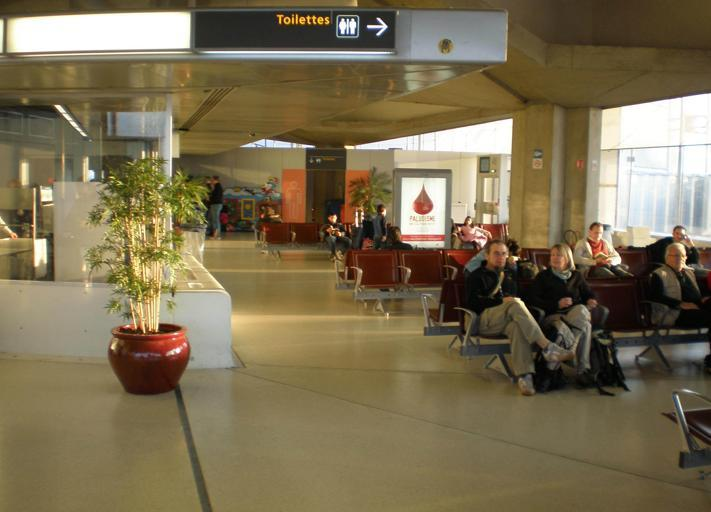

In [94]:
image = Image.open('./ADE20k_toy_dataset/images/training/ADE_train_00000002.jpg')
image

In [95]:
# prepare the image for the model
pixel_values = image_processor(image, return_tensors="pt").pixel_values.to(device)
print(pixel_values.shape)

torch.Size([1, 3, 512, 512])


In [96]:
import torch

# forward pass
with torch.no_grad():
  outputs = model(pixel_values=pixel_values)

In [97]:
# logits are of shape (batch_size, num_labels, height/4, width/4)
logits = outputs.logits.cpu()
print(logits.shape)

torch.Size([1, 150, 128, 128])


In [34]:
def ade_palette():
    """ADE20K palette that maps each class to RGB values."""
    return [[120, 120, 120], [180, 120, 120], [6, 230, 230], [80, 50, 50],
            [4, 200, 3], [120, 120, 80], [140, 140, 140], [204, 5, 255],
            [230, 230, 230], [4, 250, 7], [224, 5, 255], [235, 255, 7],
            [150, 5, 61], [120, 120, 70], [8, 255, 51], [255, 6, 82],
            [143, 255, 140], [204, 255, 4], [255, 51, 7], [204, 70, 3],
            [0, 102, 200], [61, 230, 250], [255, 6, 51], [11, 102, 255],
            [255, 7, 71], [255, 9, 224], [9, 7, 230], [220, 220, 220],
            [255, 9, 92], [112, 9, 255], [8, 255, 214], [7, 255, 224],
            [255, 184, 6], [10, 255, 71], [255, 41, 10], [7, 255, 255],
            [224, 255, 8], [102, 8, 255], [255, 61, 6], [255, 194, 7],
            [255, 122, 8], [0, 255, 20], [255, 8, 41], [255, 5, 153],
            [6, 51, 255], [235, 12, 255], [160, 150, 20], [0, 163, 255],
            [140, 140, 140], [250, 10, 15], [20, 255, 0], [31, 255, 0],
            [255, 31, 0], [255, 224, 0], [153, 255, 0], [0, 0, 255],
            [255, 71, 0], [0, 235, 255], [0, 173, 255], [31, 0, 255],
            [11, 200, 200], [255, 82, 0], [0, 255, 245], [0, 61, 255],
            [0, 255, 112], [0, 255, 133], [255, 0, 0], [255, 163, 0],
            [255, 102, 0], [194, 255, 0], [0, 143, 255], [51, 255, 0],
            [0, 82, 255], [0, 255, 41], [0, 255, 173], [10, 0, 255],
            [173, 255, 0], [0, 255, 153], [255, 92, 0], [255, 0, 255],
            [255, 0, 245], [255, 0, 102], [255, 173, 0], [255, 0, 20],
            [255, 184, 184], [0, 31, 255], [0, 255, 61], [0, 71, 255],
            [255, 0, 204], [0, 255, 194], [0, 255, 82], [0, 10, 255],
            [0, 112, 255], [51, 0, 255], [0, 194, 255], [0, 122, 255],
            [0, 255, 163], [255, 153, 0], [0, 255, 10], [255, 112, 0],
            [143, 255, 0], [82, 0, 255], [163, 255, 0], [255, 235, 0],
            [8, 184, 170], [133, 0, 255], [0, 255, 92], [184, 0, 255],
            [255, 0, 31], [0, 184, 255], [0, 214, 255], [255, 0, 112],
            [92, 255, 0], [0, 224, 255], [112, 224, 255], [70, 184, 160],
            [163, 0, 255], [153, 0, 255], [71, 255, 0], [255, 0, 163],
            [255, 204, 0], [255, 0, 143], [0, 255, 235], [133, 255, 0],
            [255, 0, 235], [245, 0, 255], [255, 0, 122], [255, 245, 0],
            [10, 190, 212], [214, 255, 0], [0, 204, 255], [20, 0, 255],
            [255, 255, 0], [0, 153, 255], [0, 41, 255], [0, 255, 204],
            [41, 0, 255], [41, 255, 0], [173, 0, 255], [0, 245, 255],
            [71, 0, 255], [122, 0, 255], [0, 255, 184], [0, 92, 255],
            [184, 255, 0], [0, 133, 255], [255, 214, 0], [25, 194, 194],
            [102, 255, 0], [92, 0, 255]]

In [98]:
predicted_segmentation_map = image_processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]
predicted_segmentation_map = predicted_segmentation_map.cpu().numpy()
print(predicted_segmentation_map)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [3 3 3 ... 3 3 3]
 [3 3 3 ... 3 3 3]
 [3 3 3 ... 3 3 3]]


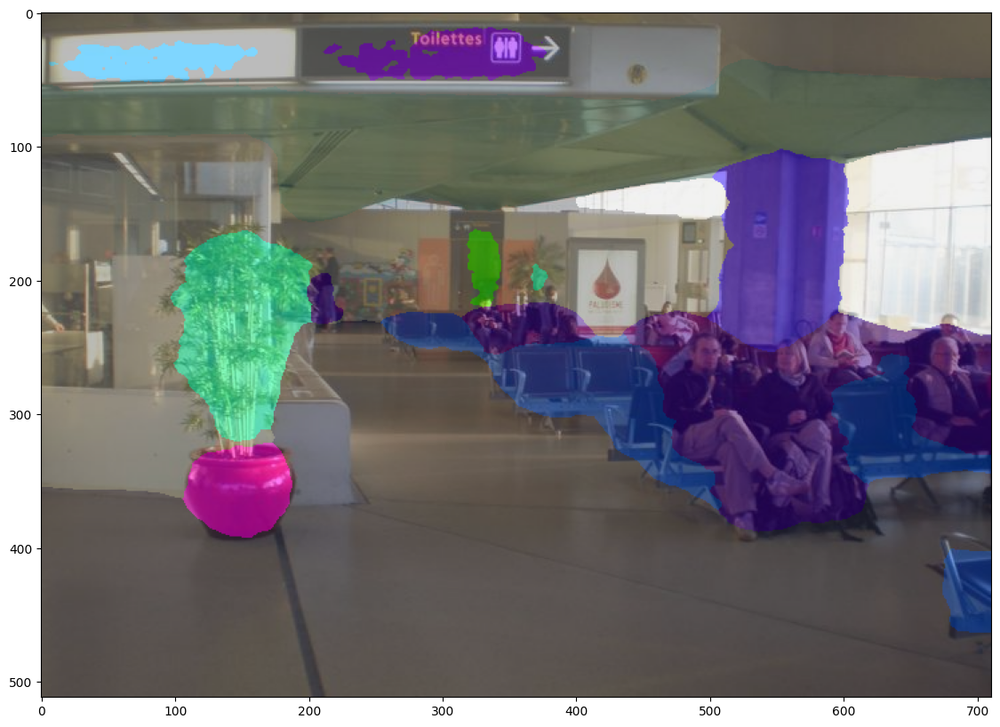

In [99]:
import matplotlib.pyplot as plt
import numpy as np

color_seg = np.zeros((predicted_segmentation_map.shape[0],
                      predicted_segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3

palette = np.array(ade_palette())
for label, color in enumerate(palette):
    color_seg[predicted_segmentation_map == label, :] = color
# Convert to BGR
color_seg = color_seg[..., ::-1]

# Show image + mask
img = np.array(image) * 0.5 + color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

Compare this to the ground truth segmentation map:

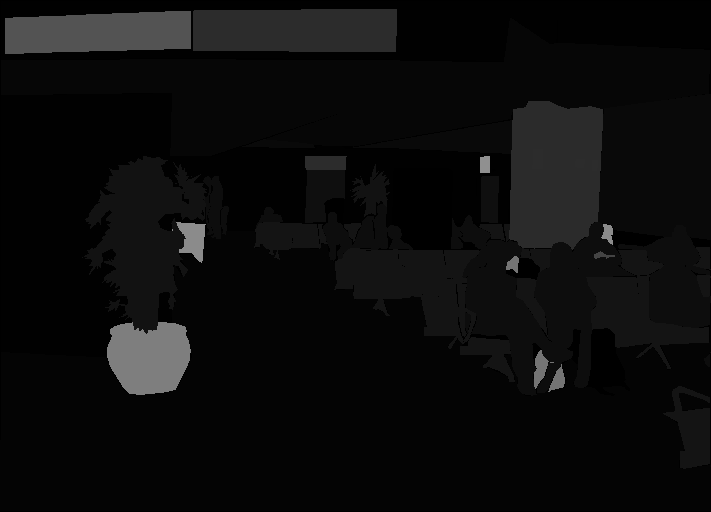

In [100]:
map = Image.open('./ADE20k_toy_dataset/annotations/training/ADE_train_00000002.png')
map

Classes in this image: ['wall', 'floor', 'ceiling', 'windowpane', 'person', 'door', 'plant', 'chair', 'column', 'signboard', 'book', 'light', 'bag', 'pot', 'ashcan', 'monitor', None]


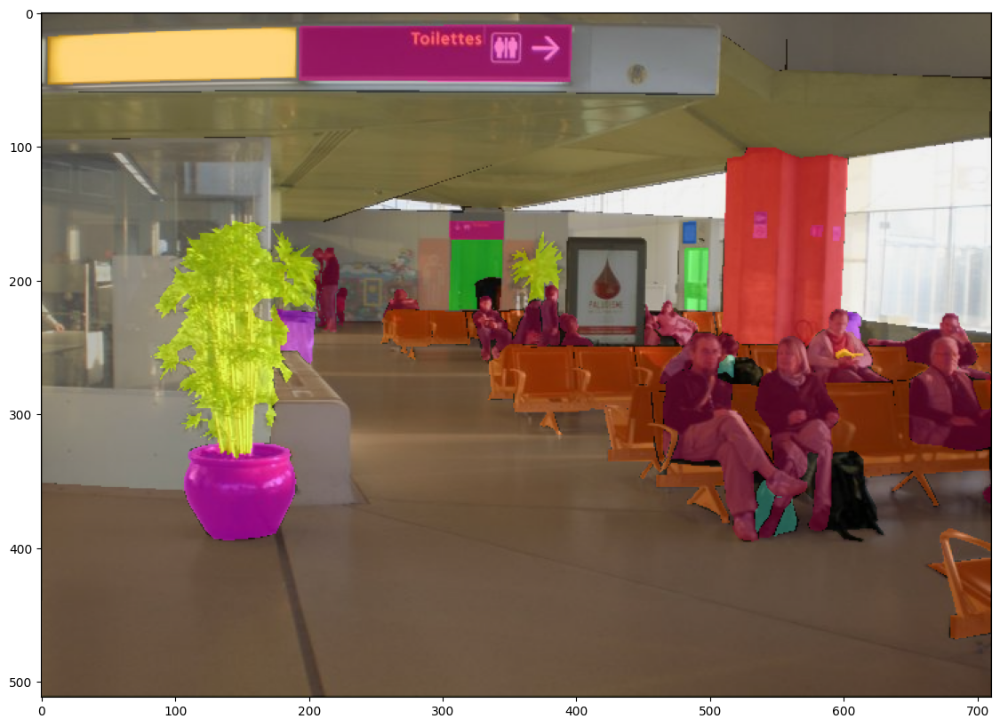

In [101]:
# convert map to NumPy array
import cv2
map = np.array(map)
map[map == 0] = 255 # background class is replaced by ignore_index
map = map - 1 # other classes are reduced by one
map[map == 254] = 255

classes_map = np.unique(map).tolist()
unique_classes = [model.config.id2label[idx] if idx!=255 else None for idx in classes_map]
print("Classes in this image:", unique_classes)

# create coloured map
color_seg = np.zeros((map.shape[0], map.shape[1], 3), dtype=np.uint8) # height, width, 3
palette = np.array(ade_palette())
for label, color in enumerate(palette):
    color_seg[map == label, :] = color
# Convert to BGR
color_seg = cv2.resize(color_seg, (img.shape[1], img.shape[0]))

# Show image + mask
img = np.array(image) * 0.5 + color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

Let's compute the metrics:

In [102]:
# metric expects a list of numpy arrays for both predictions and references
metrics = metric._compute(
                  predictions=[predicted_segmentation_map],
                  references=[map],
                  num_labels=len(id2label),
                  ignore_index=255,
                  reduce_labels=False, # we've already reduced the labels ourselves
              )

/home/mist861/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/home/mist861/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


In [103]:
metrics.keys()

dict_keys(['mean_iou', 'mean_accuracy', 'overall_accuracy', 'per_category_iou', 'per_category_accuracy'])

In [104]:
import pandas as pd

# print overall metrics
for key in list(metrics.keys())[:3]:
  print(key, metrics[key])

# pretty-print per category metrics as Pandas DataFrame
metric_table = dict()
for id, label in id2label.items():
    metric_table[label] = [
                           metrics["per_category_iou"][id],
                           metrics["per_category_accuracy"][id]
    ]

print("---------------------")
print("per-category metrics:")
pd.DataFrame.from_dict(metric_table, orient="index", columns=["IoU", "accuracy"])

mean_iou 0.5355828453568489
mean_accuracy 0.5784857385193045
overall_accuracy 0.9099236771804178
---------------------
per-category metrics:


,IoU,accuracy
wall,0.770777,0.965152
building,NaN,NaN
sky,NaN,NaN
floor,0.964600,0.985037
tree,NaN,NaN
...,...,...
shower,NaN,NaN
radiator,NaN,NaN
glass,NaN,NaN
clock,NaN,NaN


In [105]:
metric_table

{'wall': [np.float64(0.7707772020725389), np.float64(0.9651523234187344)],
 'building': [np.float64(nan), np.float64(nan)],
 'sky': [np.float64(nan), np.float64(nan)],
 'floor': [np.float64(0.9645996952291642), np.float64(0.9850371079722289)],
 'tree': [np.float64(nan), np.float64(nan)],
 'ceiling': [np.float64(0.9232303304526838), np.float64(0.9534070022366411)],
 'road': [np.float64(nan), np.float64(nan)],
 'bed ': [np.float64(nan), np.float64(nan)],
 'windowpane': [np.float64(0.9237803178143296),
  np.float64(0.9452304883614788)],
 'grass': [np.float64(nan), np.float64(nan)],
 'cabinet': [np.float64(nan), np.float64(nan)],
 'sidewalk': [np.float64(nan), np.float64(nan)],
 'person': [np.float64(0.7318832698930579), np.float64(0.8968902709906709)],
 'earth': [np.float64(nan), np.float64(nan)],
 'door': [np.float64(0.26897625535227715), np.float64(0.2898489932885906)],
 'table': [np.float64(nan), np.float64(nan)],
 'mountain': [np.float64(nan), np.float64(nan)],
 'plant': [np.float64(0

# Test Image 1

## Defining Functions

In [40]:
import matplotlib.pyplot as plt
import numpy as np

def segment_image(image):
    pixel_values = image_processor(image, return_tensors="pt").pixel_values.to(device)
    
    with torch.no_grad():
      outputs = model(pixel_values=pixel_values)
    
    logits = outputs.logits.cpu()
    
    predicted_segmentation_map = image_processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]
    predicted_segmentation_map = predicted_segmentation_map.cpu().numpy()
    
    color_seg = np.zeros((predicted_segmentation_map.shape[0],
                          predicted_segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
    
    palette = np.array(ade_palette())
    for label, color in enumerate(palette):
        color_seg[predicted_segmentation_map == label, :] = color
    # Convert to BGR
    color_seg = color_seg[..., ::-1]
    
    # Show image + mask
    img = np.array(image) * 0.5 + color_seg * 0.5
    img = img.astype(np.uint8)
    
    plt.figure(figsize=(15, 10))
    plt.imshow(img)
    plt.show()
    return predicted_segmentation_map, img

In [48]:
import cv2

def show_segment_label(map, img):
    map = np.array(map)
    map[map == 0] = 255 # background class is replaced by ignore_index
    map = map - 1 # other classes are reduced by one
    map[map == 254] = 255
    
    classes_map = np.unique(map).tolist()
    unique_classes = [model.config.id2label[idx] if idx!=255 else None for idx in classes_map]
    print("Classes in this image:", unique_classes)
    
    # create coloured map
    color_seg = np.zeros((map.shape[0], map.shape[1], 3), dtype=np.uint8) # height, width, 3
    palette = np.array(ade_palette())
    for label, color in enumerate(palette):
        color_seg[map == label, :] = color
    # Convert to BGR
    color_seg = cv2.resize(color_seg, (img.shape[1], img.shape[0]))
    
    # Show image + mask
    img = np.array(image) * 0.5 + color_seg * 0.5
    img = img.astype(np.uint8)
    
    plt.figure(figsize=(15, 10))
    plt.imshow(img)
    plt.show()
    return map

In [65]:
import pandas as pd

def show_metrics(predicted_segmentation_map, map):
    metrics = metric._compute(
                  predictions=[predicted_segmentation_map],
                  references=[map],
                  num_labels=len(id2label),
                  ignore_index=255,
                  reduce_labels=False, # we've already reduced the labels ourselves
              )
    # print overall metrics
    for key in list(metrics.keys())[:3]:
      print(key, metrics[key])
    
    # pretty-print per category metrics as Pandas DataFrame
    metric_table = dict()
    for id, label in id2label.items():
        metric_table[label] = [
                               metrics["per_category_iou"][id],
                               metrics["per_category_accuracy"][id]
        ]
    
    results = pd.DataFrame.from_dict(metric_table, orient="index", columns=["IoU", "accuracy"])
    return results

## Testing a Random Image

In [4]:
import random

In [37]:
print(random.randint(1, 20))

16


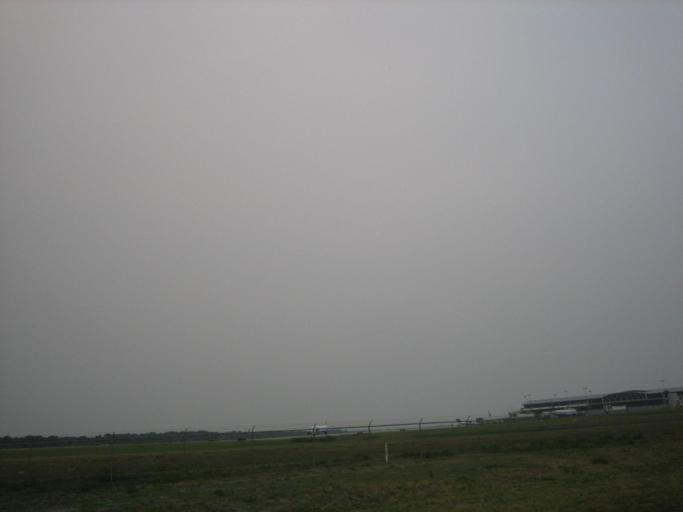

In [135]:
# I'm being lazy, so in this case "16" = dataset 2 (validation) image 6
image = Image.open('./ADE20k_toy_dataset/images/validation/ADE_val_00000006.jpg')
image

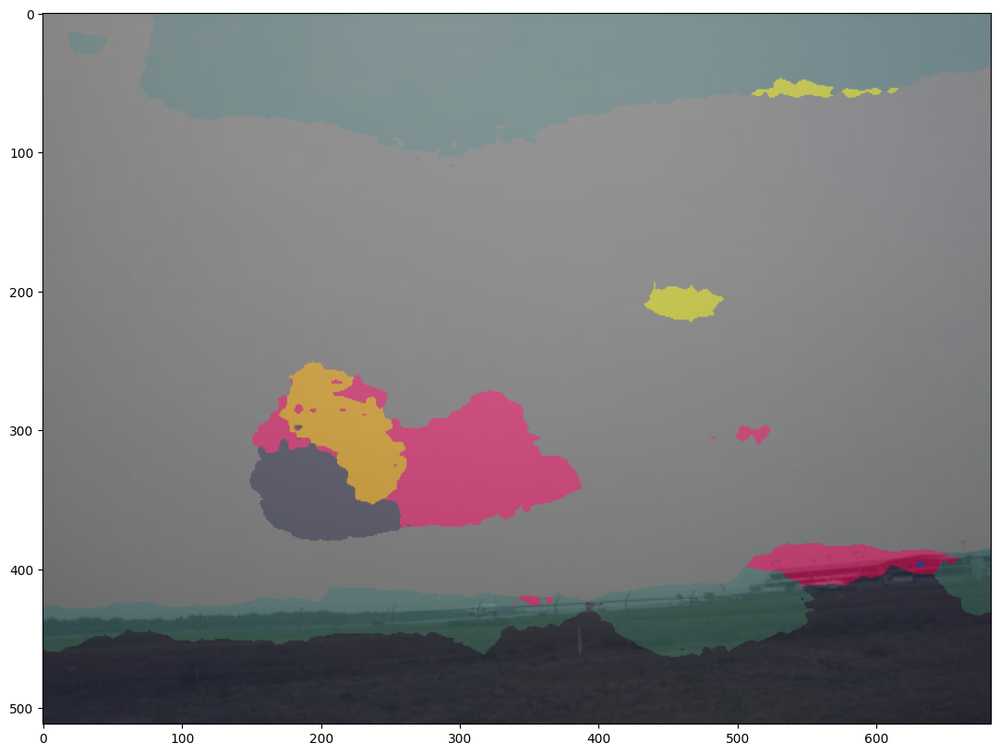

In [136]:
predicted_map, img = segment_image(image)

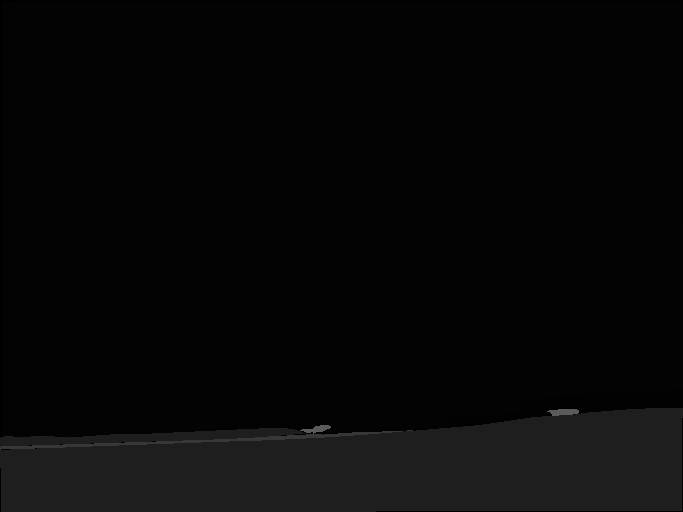

In [137]:
map = Image.open('./ADE20k_toy_dataset/annotations/validation/ADE_val_00000006.png')
map

Classes in this image: ['building', 'sky', 'field', 'runway', 'airplane', None]


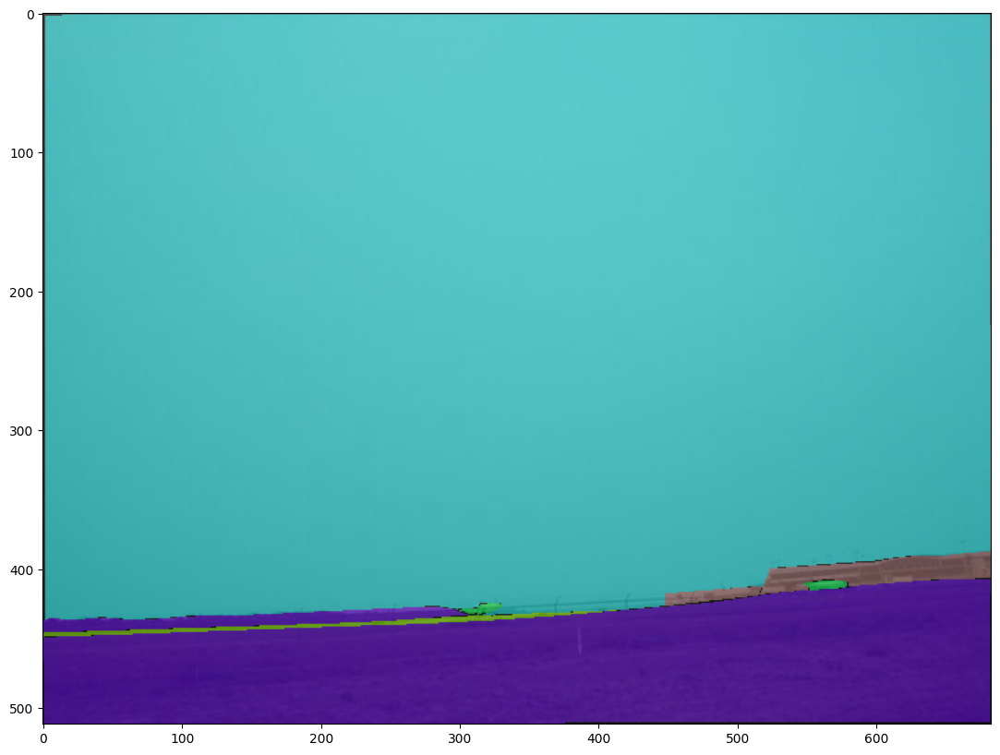

In [138]:
map = show_segment_label(map, img)

In [139]:
val_6_results = show_metrics(predicted_map, map)

mean_iou 0.00046697588515541376
mean_accuracy 0.0011207421243729931
overall_accuracy 0.004615251649333065


In [140]:
val_6_results

,IoU,accuracy
wall,0.000000,NaN
building,0.000000,0.000000
sky,0.005604,0.005604
floor,0.000000,NaN
tree,NaN,NaN
...,...,...
shower,NaN,NaN
radiator,NaN,NaN
glass,NaN,NaN
clock,NaN,NaN


# Test Image 2

In [113]:
print(random.randint(1, 20))

1


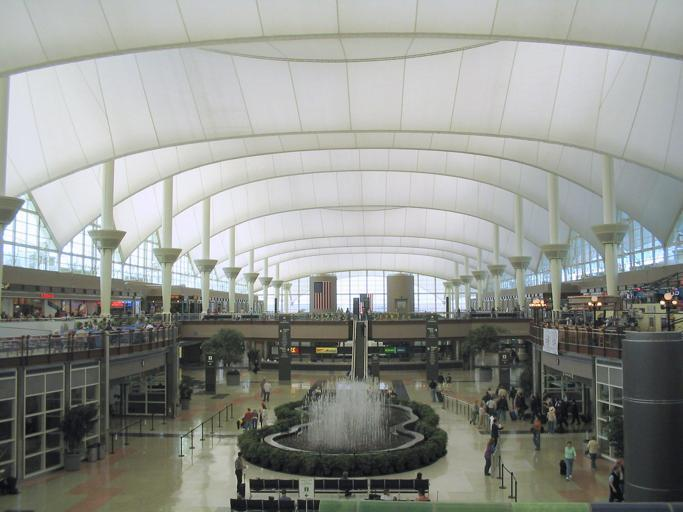

In [141]:
image = Image.open('./ADE20k_toy_dataset/images/training/ADE_train_00000001.jpg')
image

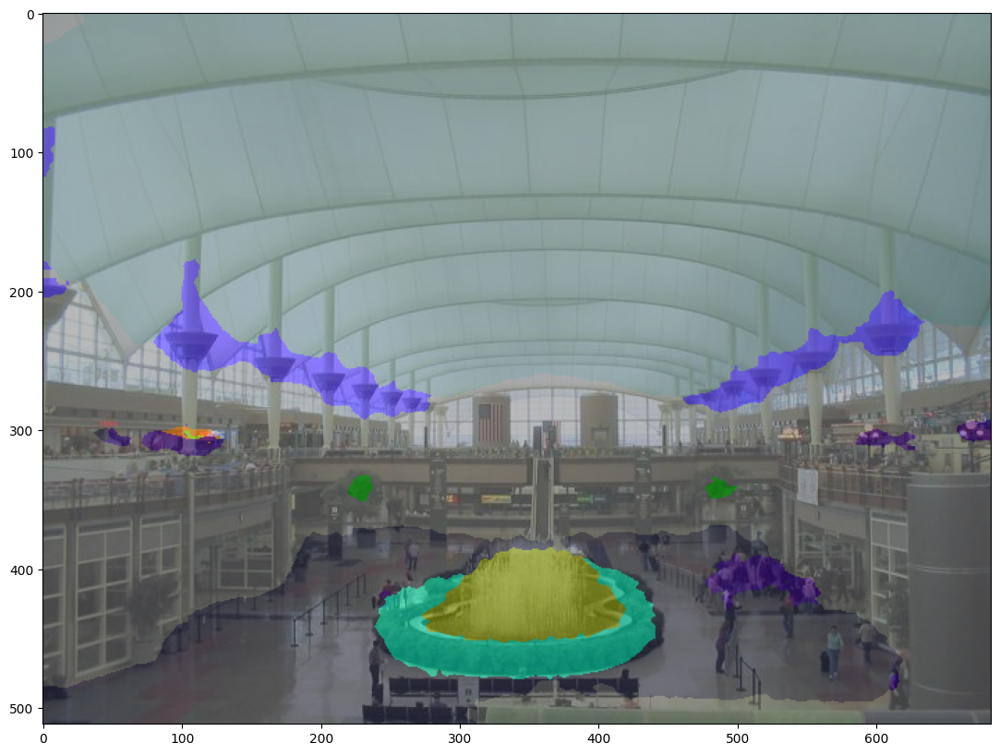

In [142]:
predicted_map, img = segment_image(image)

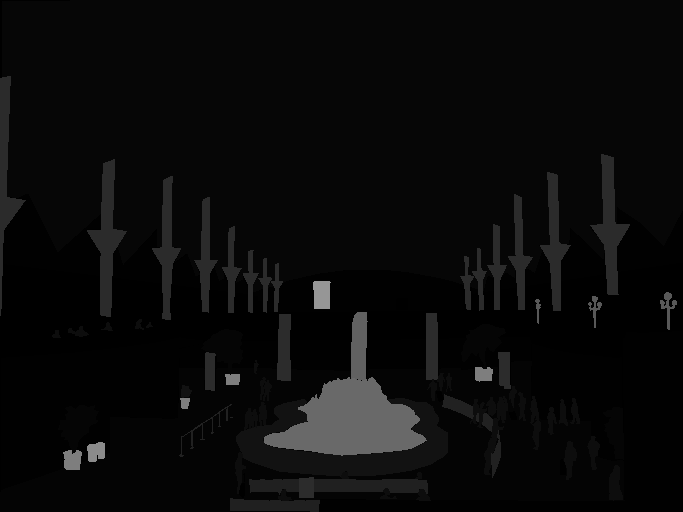

In [143]:
map = Image.open('./ADE20k_toy_dataset/annotations/training/ADE_train_00000001.png')
map

Classes in this image: ['wall', 'floor', 'tree', 'ceiling', 'person', 'plant', 'seat', 'fence', 'column', 'signboard', 'streetlight', 'escalator', 'fountain', 'pot', 'ashcan', 'flag', None]


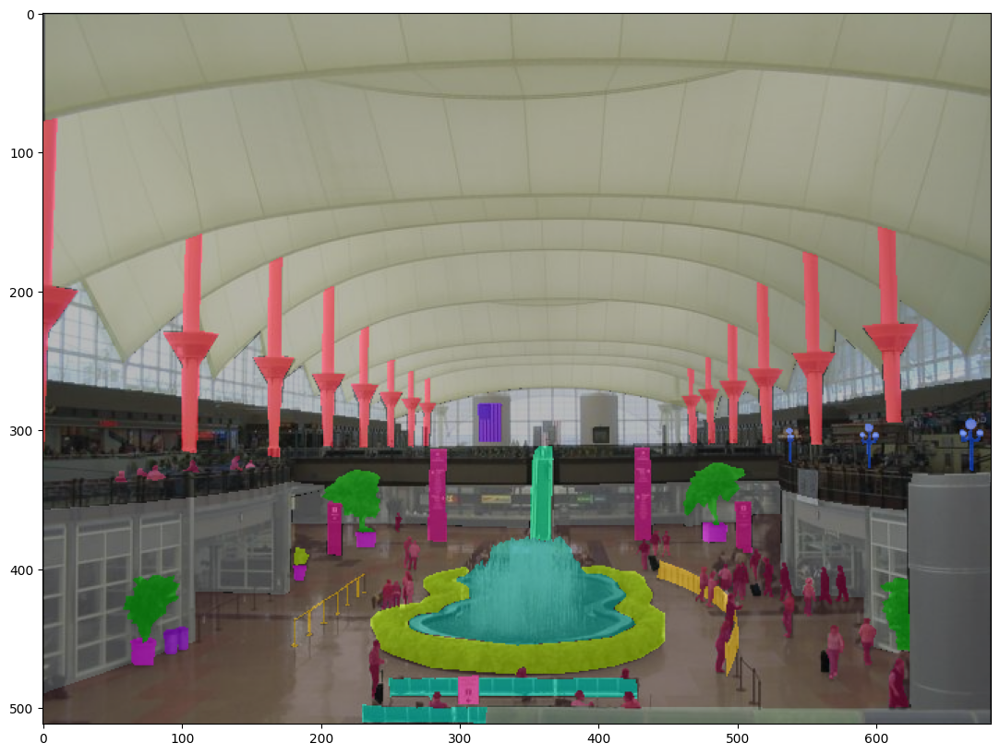

In [144]:
map = show_segment_label(map, img)

In [145]:
train_2_results = show_metrics(predicted_map, map)

mean_iou 0.2449337713775419
mean_accuracy 0.32275598687008566
overall_accuracy 0.8679413453273237


/home/mist861/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/home/mist861/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


In [146]:
train_2_results

,IoU,accuracy
wall,0.719774,0.965580
building,NaN,NaN
sky,NaN,NaN
floor,0.699748,0.850365
tree,0.113823,0.113970
...,...,...
shower,0.000000,NaN
radiator,NaN,NaN
glass,NaN,NaN
clock,NaN,NaN


# Test Image 3

In [147]:
print(random.randint(1, 20))

9


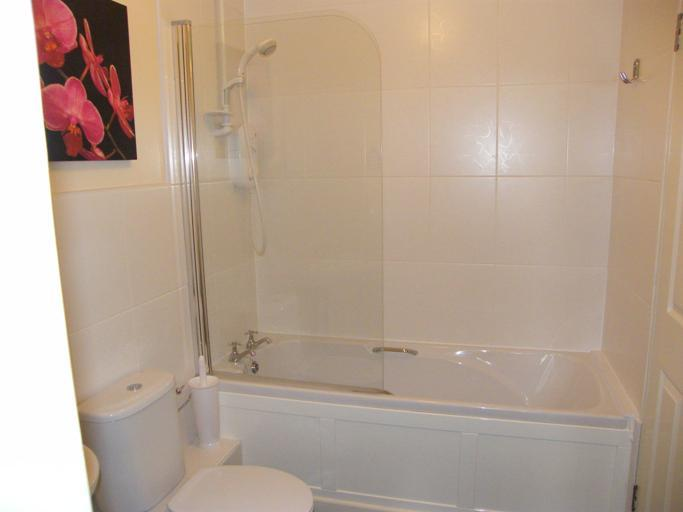

In [148]:
image = Image.open('./ADE20k_toy_dataset/images/training/ADE_train_00000009.jpg')
image

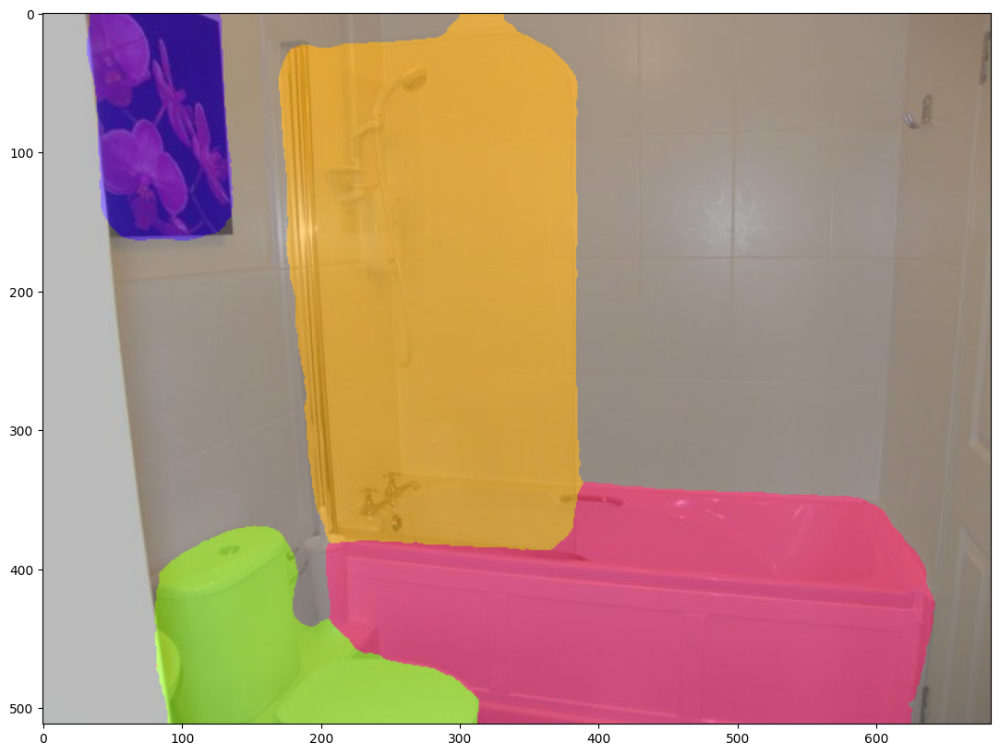

In [149]:
predicted_map, img = segment_image(image)

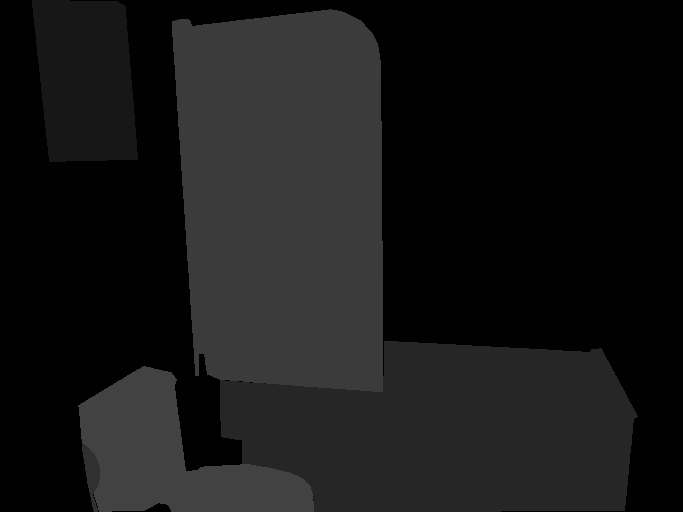

In [150]:
map = Image.open('./ADE20k_toy_dataset/annotations/training/ADE_train_00000009.png')
map

Classes in this image: ['wall', 'painting', 'bathtub', 'sink', 'screen door', 'toilet', None]


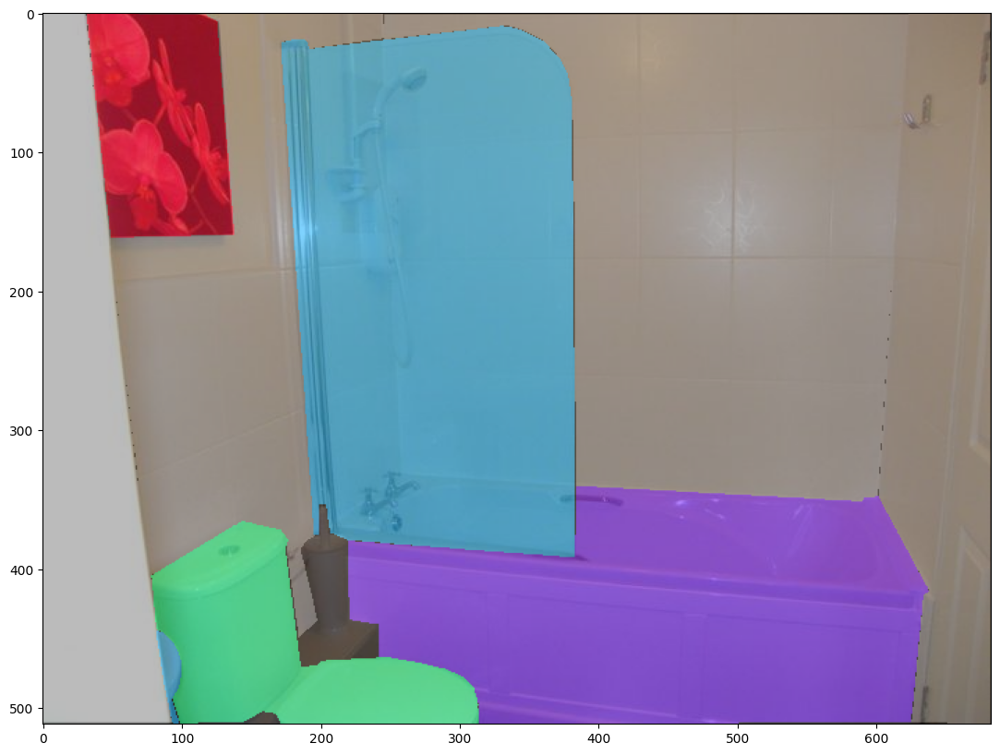

In [151]:
map = show_segment_label(map, img)

In [153]:
train_9_results = show_metrics(predicted_map, map)

mean_iou 0.7958362936564164
mean_accuracy 0.8216392429782546
overall_accuracy 0.982331847679331


/home/mist861/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/home/mist861/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


In [154]:
train_9_results

,IoU,accuracy
wall,0.97443,0.979213
building,NaN,NaN
sky,NaN,NaN
floor,NaN,NaN
tree,NaN,NaN
...,...,...
shower,NaN,NaN
radiator,NaN,NaN
glass,NaN,NaN
clock,NaN,NaN


# New Dataset

In [17]:
from transformers import SegformerImageProcessor

root_dir = './Oxford-IIIT' # https://www.robots.ox.ac.uk/~vgg/data/pets/
image_processor = SegformerImageProcessor(reduce_labels=True)

train_dataset = SemanticSegmentationDataset(root_dir=root_dir, image_processor=image_processor)
valid_dataset = SemanticSegmentationDataset(root_dir=root_dir, image_processor=image_processor, train=False)

In [18]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(valid_dataset))

Number of training examples: 34
Number of validation examples: 34


In [19]:
encoded_inputs = train_dataset[0]

In [20]:
encoded_inputs["pixel_values"].shape

torch.Size([3, 512, 512])

In [21]:
encoded_inputs["labels"].shape

torch.Size([512, 512])

In [22]:
encoded_inputs["labels"]

tensor([[1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]])

In [23]:
encoded_inputs["labels"].squeeze().unique()

tensor([0, 1, 2])

In [24]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True)
valid_dataloader = DataLoader(valid_dataset, batch_size=2)

In [25]:
batch = next(iter(train_dataloader))

In [26]:
for k,v in batch.items():
  print(k, v.shape)

pixel_values torch.Size([2, 3, 512, 512])
labels torch.Size([2, 512, 512])


In [27]:
batch["labels"].shape

torch.Size([2, 512, 512])

In [28]:
mask = (batch["labels"] != 255)
mask

tensor([[[True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         ...,
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True]],

        [[True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         ...,
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True]]])

In [50]:
batch["labels"][mask]

tensor([1, 1, 1,  ..., 1, 1, 1])

In [70]:
from transformers import SegformerForSemanticSegmentation
import json

# load id2label mapping from a JSON on the hub
id2label = {0:'Foreground', 1:'Background',2:'Not classified'}
label2id = {'Foreground':0, 'Background':1, 'Not classified':2}

# define model
model = SegformerForSemanticSegmentation.from_pretrained("nvidia/mit-b0",
                                                         num_labels=3,
                                                         id2label=id2label,
                                                         label2id=label2id,
)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head.batch_norm.bias', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.batch_norm.running_mean', 'decode_head.batch_norm.running_var', 'decode_head.batch_norm.weight', 'decode_head.classifier.bias', 'decode_head.classifier.weight', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_fuse.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [71]:
import evaluate

metric = evaluate.load("mean_iou")

In [72]:
image_processor.do_reduce_labels

True

In [73]:
import torch
from torch import nn
from sklearn.metrics import accuracy_score
from tqdm.notebook import tqdm

# define optimizer
optimizer = torch.optim.AdamW(model.parameters(), lr=0.00006)
# move model to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

model.train()
for epoch in range(200):  # loop over the dataset multiple times
   print("Epoch:", epoch)
   for idx, batch in enumerate(tqdm(train_dataloader)):
        # get the inputs;
        pixel_values = batch["pixel_values"].to(device)
        labels = batch["labels"].to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(pixel_values=pixel_values, labels=labels)
        loss, logits = outputs.loss, outputs.logits

        loss.backward()
        optimizer.step()

        # evaluate
        with torch.no_grad():
          upsampled_logits = nn.functional.interpolate(logits, size=labels.shape[-2:], mode="bilinear", align_corners=False)
          predicted = upsampled_logits.argmax(dim=1)

          # note that the metric expects predictions + labels as numpy arrays
          metric.add_batch(predictions=predicted.detach().cpu().numpy(), references=labels.detach().cpu().numpy())

        # let's print loss and metrics every 100 batches
        if idx % 100 == 0:
          # currently using _compute instead of compute
          # see this issue for more info: https://github.com/huggingface/evaluate/pull/328#issuecomment-1286866576
          metrics = metric._compute(
                  predictions=predicted.cpu(),
                  references=labels.cpu(),
                  num_labels=len(id2label),
                  ignore_index=255,
                  reduce_labels=False, # we've already reduced the labels ourselves
              )

          print("Loss:", loss.item())
          print("Mean_iou:", metrics["mean_iou"])
          print("Mean accuracy:", metrics["mean_accuracy"])

Epoch: 0


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 1.0938687324523926
Mean_iou: 0.17324494735515392
Mean accuracy: 0.28656042851380037
Epoch: 1


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.7842596173286438
Mean_iou: 0.5200513460350827
Mean accuracy: 0.7409372628914345
Epoch: 2


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.47123071551322937
Mean_iou: 0.7546192336176452
Mean accuracy: 0.850890868862264
Epoch: 3


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.4860966205596924
Mean_iou: 0.6317662077644293
Mean accuracy: 0.7543319212532063
Epoch: 4


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.33639898896217346
Mean_iou: 0.8070073342959753
Mean accuracy: 0.8926141972283713
Epoch: 5


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.2501043975353241
Mean_iou: 0.8001740535149636
Mean accuracy: 0.8893780254654456
Epoch: 6


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.2568935453891754
Mean_iou: 0.8429504322344358
Mean accuracy: 0.9209120538494595
Epoch: 7


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.2893262207508087
Mean_iou: 0.7703948307035486
Mean accuracy: 0.8717427712155535
Epoch: 8


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.23883509635925293
Mean_iou: 0.8248216339794858
Mean accuracy: 0.9290096310481415
Epoch: 9


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.3665561079978943
Mean_iou: 0.727070648979694
Mean accuracy: 0.8814318225657981
Epoch: 10


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.23997294902801514
Mean_iou: 0.7831970096162663
Mean accuracy: 0.8855770030820794
Epoch: 11


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.2041289061307907
Mean_iou: 0.8390035908952403
Mean accuracy: 0.9139053439102934
Epoch: 12


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.17675311863422394
Mean_iou: 0.8403737096598487
Mean accuracy: 0.9231994407040313
Epoch: 13


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.17246878147125244
Mean_iou: 0.8702940046443605
Mean accuracy: 0.9267141658436877
Epoch: 14


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.15319669246673584
Mean_iou: 0.8439311442829923
Mean accuracy: 0.9460257467868823
Epoch: 15


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.1648203730583191
Mean_iou: 0.8314944269526094
Mean accuracy: 0.9291488020809099
Epoch: 16


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.22215887904167175
Mean_iou: 0.8384579114284594
Mean accuracy: 0.9150760692527203
Epoch: 17


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.14890006184577942
Mean_iou: 0.8709861440173379
Mean accuracy: 0.9303183760260795
Epoch: 18


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.17437873780727386
Mean_iou: 0.8277568500839498
Mean accuracy: 0.916854608109056
Epoch: 19


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.1825733482837677
Mean_iou: 0.8485830647823835
Mean accuracy: 0.923185767781173
Epoch: 20


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.18208859860897064
Mean_iou: 0.8595578453584439
Mean accuracy: 0.9172732238683867
Epoch: 21


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.16453318297863007
Mean_iou: 0.8480559113285427
Mean accuracy: 0.9415829111461251
Epoch: 22


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.14672836661338806
Mean_iou: 0.8681759400501798
Mean accuracy: 0.9231661956357838
Epoch: 23


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.10520400106906891
Mean_iou: 0.8808611716132985
Mean accuracy: 0.9615559510941593
Epoch: 24


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.1256048083305359
Mean_iou: 0.8907030543570319
Mean accuracy: 0.9463241604178796
Epoch: 25


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.18046119809150696
Mean_iou: 0.8891764114488606
Mean accuracy: 0.9355006590755028
Epoch: 26


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.13474872708320618
Mean_iou: 0.8567978896776228
Mean accuracy: 0.9245331636910775
Epoch: 27


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.11267909407615662
Mean_iou: 0.88849262215288
Mean accuracy: 0.9305139384358188
Epoch: 28


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.10966131836175919
Mean_iou: 0.8845996403084881
Mean accuracy: 0.9437033867880046
Epoch: 29


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.11381769925355911
Mean_iou: 0.8948949707181025
Mean accuracy: 0.9388270639990254
Epoch: 30


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.10179594159126282
Mean_iou: 0.8795367540111316
Mean accuracy: 0.9573028646535532
Epoch: 31


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.10027503967285156
Mean_iou: 0.9002661901888621
Mean accuracy: 0.9448418356897109
Epoch: 32


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.09799455106258392
Mean_iou: 0.8969416415687398
Mean accuracy: 0.9454865216075089
Epoch: 33


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.1439085602760315
Mean_iou: 0.8830701386850989
Mean accuracy: 0.9464451371949135
Epoch: 34


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.16487684845924377
Mean_iou: 0.8631746907231773
Mean accuracy: 0.9448024543246333
Epoch: 35


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.1375698447227478
Mean_iou: 0.8769760355541515
Mean accuracy: 0.9204995848184757
Epoch: 36


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.09662410616874695
Mean_iou: 0.8962114283531687
Mean accuracy: 0.9490052374985507
Epoch: 37


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.09451035410165787
Mean_iou: 0.8984386687379594
Mean accuracy: 0.949140120598968
Epoch: 38


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.11732396483421326
Mean_iou: 0.8737413632437449
Mean accuracy: 0.9408508760270986
Epoch: 39


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.08051349967718124
Mean_iou: 0.9307447621948759
Mean accuracy: 0.9597815889956314
Epoch: 40


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.09960855543613434
Mean_iou: 0.907364304577002
Mean accuracy: 0.9515338972242686
Epoch: 41


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.0677318423986435
Mean_iou: 0.9295554600131314
Mean accuracy: 0.959698651350975
Epoch: 42


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.1008753702044487
Mean_iou: 0.8951714797232481
Mean accuracy: 0.943441149987521
Epoch: 43


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.10253999382257462
Mean_iou: 0.8847728393259878
Mean accuracy: 0.9408646525416652
Epoch: 44


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.07843831181526184
Mean_iou: 0.9177895950216456
Mean accuracy: 0.9595198772750196
Epoch: 45


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.12610921263694763
Mean_iou: 0.9127276603811557
Mean accuracy: 0.9530799074242015
Epoch: 46


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.16842906177043915
Mean_iou: 0.8360828933395251
Mean accuracy: 0.8975270214665603
Epoch: 47


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.11638858914375305
Mean_iou: 0.8830489260086872
Mean accuracy: 0.9481644514554534
Epoch: 48


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.13412803411483765
Mean_iou: 0.8613645116936807
Mean accuracy: 0.9177008790442117
Epoch: 49


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.08286381512880325
Mean_iou: 0.9061874708321671
Mean accuracy: 0.9437237918574101
Epoch: 50


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.17406022548675537
Mean_iou: 0.905102409722994
Mean accuracy: 0.9602607289400072
Epoch: 51


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.17346221208572388
Mean_iou: 0.84644857223564
Mean accuracy: 0.9346947497733159
Epoch: 52


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.08652234822511673
Mean_iou: 0.9112172348356511
Mean accuracy: 0.9452586885080067
Epoch: 53


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.08681511878967285
Mean_iou: 0.9054625510686943
Mean accuracy: 0.9526865761295462
Epoch: 54


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.0704292580485344
Mean_iou: 0.9252359372763439
Mean accuracy: 0.9601205367221638
Epoch: 55


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.061321988701820374
Mean_iou: 0.9253146782358551
Mean accuracy: 0.9615782918789254
Epoch: 56


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.07714442163705826
Mean_iou: 0.9231952825898054
Mean accuracy: 0.9549212500608734
Epoch: 57


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.08779966831207275
Mean_iou: 0.9044807697407385
Mean accuracy: 0.9591370302858696
Epoch: 58


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.08135838806629181
Mean_iou: 0.907714040024393
Mean accuracy: 0.9544051691438044
Epoch: 59


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.06949430704116821
Mean_iou: 0.9121975456706607
Mean accuracy: 0.954274430732757
Epoch: 60


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.11571615189313889
Mean_iou: 0.8521582160665365
Mean accuracy: 0.9222496824277279
Epoch: 61


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.11914948374032974
Mean_iou: 0.8747459402897335
Mean accuracy: 0.9176575448481938
Epoch: 62


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.1643960177898407
Mean_iou: 0.8319645969450904
Mean accuracy: 0.8891336485301409
Epoch: 63


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.14758756756782532
Mean_iou: 0.8226001876529355
Mean accuracy: 0.9096460821075688
Epoch: 64


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.13394354283809662
Mean_iou: 0.8403857945719396
Mean accuracy: 0.9349430089960902
Epoch: 65


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.08242705464363098
Mean_iou: 0.908242614514427
Mean accuracy: 0.9510447474469244
Epoch: 66


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.07144153863191605
Mean_iou: 0.9217327601145646
Mean accuracy: 0.9611452375735062
Epoch: 67


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.11528144776821136
Mean_iou: 0.8924231096426093
Mean accuracy: 0.9435611133841825
Epoch: 68


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.11433327198028564
Mean_iou: 0.8836018949913763
Mean accuracy: 0.9412603223296361
Epoch: 69


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.06652874499559402
Mean_iou: 0.9144157627533739
Mean accuracy: 0.9636796696819495
Epoch: 70


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.06615146994590759
Mean_iou: 0.9137153239640412
Mean accuracy: 0.9622790431120819
Epoch: 71


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.07393257319927216
Mean_iou: 0.9167216911274373
Mean accuracy: 0.9660597799138188
Epoch: 72


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.0767354890704155
Mean_iou: 0.9181023288293647
Mean accuracy: 0.9574332348556117
Epoch: 73


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.07351525127887726
Mean_iou: 0.9121199918596344
Mean accuracy: 0.9557296533737701
Epoch: 74


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.059701722115278244
Mean_iou: 0.9343650764829383
Mean accuracy: 0.9629152584676356
Epoch: 75


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.11021268367767334
Mean_iou: 0.8794307513394188
Mean accuracy: 0.9423773019226088
Epoch: 76


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05514107644557953
Mean_iou: 0.9149754399331153
Mean accuracy: 0.9666123120678126
Epoch: 77


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.06256897002458572
Mean_iou: 0.9133672615258304
Mean accuracy: 0.9659886725974118
Epoch: 78


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.0754980593919754
Mean_iou: 0.9067969277928808
Mean accuracy: 0.9542246918782564
Epoch: 79


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05627034604549408
Mean_iou: 0.9441542074196022
Mean accuracy: 0.968321493734052
Epoch: 80


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.11152905225753784
Mean_iou: 0.9106260802471712
Mean accuracy: 0.9493414869958362
Epoch: 81


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.07371152937412262
Mean_iou: 0.9010658758454634
Mean accuracy: 0.9509687071720462
Epoch: 82


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.07176245003938675
Mean_iou: 0.9137220475054687
Mean accuracy: 0.9573271973756495
Epoch: 83


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.09168894588947296
Mean_iou: 0.8867434553665281
Mean accuracy: 0.9515046196461082
Epoch: 84


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05850011110305786
Mean_iou: 0.9364705833687347
Mean accuracy: 0.9659654798065374
Epoch: 85


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04850640147924423
Mean_iou: 0.9450035403611218
Mean accuracy: 0.9719972316304655
Epoch: 86


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.10494769364595413
Mean_iou: 0.8630242524142329
Mean accuracy: 0.9430234796492188
Epoch: 87


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05282522737979889
Mean_iou: 0.9298252203579707
Mean accuracy: 0.9618048693355238
Epoch: 88


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04383373260498047
Mean_iou: 0.9339476544300579
Mean accuracy: 0.9770413571300823
Epoch: 89


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.08239541947841644
Mean_iou: 0.9390684581803049
Mean accuracy: 0.970812391458581
Epoch: 90


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.07694103568792343
Mean_iou: 0.9147301184224231
Mean accuracy: 0.9471693664761759
Epoch: 91


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.06782910227775574
Mean_iou: 0.9189161504518056
Mean accuracy: 0.9564667495030336
Epoch: 92


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.1280723512172699
Mean_iou: 0.8434351164680889
Mean accuracy: 0.9183991855709763
Epoch: 93


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05605350062251091
Mean_iou: 0.9432852498734411
Mean accuracy: 0.9663786250840379
Epoch: 94


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04285091906785965
Mean_iou: 0.9331526868267649
Mean accuracy: 0.9695141463570417
Epoch: 95


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03665766492486
Mean_iou: 0.9456842082114972
Mean accuracy: 0.9743545199590621
Epoch: 96


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.052147429436445236
Mean_iou: 0.9496297996157471
Mean accuracy: 0.97312026036485
Epoch: 97


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05059334263205528
Mean_iou: 0.9518938777150968
Mean accuracy: 0.9721422912941436
Epoch: 98


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.0529092475771904
Mean_iou: 0.9349564582339732
Mean accuracy: 0.9753898569233028
Epoch: 99


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.053812913596630096
Mean_iou: 0.9248885970791113
Mean accuracy: 0.954400443005405
Epoch: 100


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.0684867799282074
Mean_iou: 0.939427398313196
Mean accuracy: 0.965595643321973
Epoch: 101


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.0532342791557312
Mean_iou: 0.9462255415816001
Mean accuracy: 0.9719462757672138
Epoch: 102


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04683366417884827
Mean_iou: 0.9441318702484734
Mean accuracy: 0.9698984311581941
Epoch: 103


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04165099188685417
Mean_iou: 0.938899448886774
Mean accuracy: 0.9690698092650201
Epoch: 104


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.046889811754226685
Mean_iou: 0.9339752099611508
Mean accuracy: 0.9653402676824849
Epoch: 105


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05935220047831535
Mean_iou: 0.934546290824132
Mean accuracy: 0.9645417095878809
Epoch: 106


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.09443897753953934
Mean_iou: 0.8849082732546156
Mean accuracy: 0.9453318989435191
Epoch: 107


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04883502051234245
Mean_iou: 0.9497817199882594
Mean accuracy: 0.9729664920863957
Epoch: 108


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.06469379365444183
Mean_iou: 0.9208732249023616
Mean accuracy: 0.9574742728886058
Epoch: 109


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.06497490406036377
Mean_iou: 0.924845641418582
Mean accuracy: 0.9603141967517552
Epoch: 110


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.056884750723838806
Mean_iou: 0.9326884905969332
Mean accuracy: 0.9630536958125693
Epoch: 111


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05225227773189545
Mean_iou: 0.9337090221945124
Mean accuracy: 0.9664223944716768
Epoch: 112


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05081382766366005
Mean_iou: 0.9389930082576327
Mean accuracy: 0.9670918371294018
Epoch: 113


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.0439748615026474
Mean_iou: 0.9268756733425935
Mean accuracy: 0.9603517826499187
Epoch: 114


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05558133125305176
Mean_iou: 0.9483815555832722
Mean accuracy: 0.9727776335194868
Epoch: 115


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05139727517962456
Mean_iou: 0.9508316552403403
Mean accuracy: 0.973810028321744
Epoch: 116


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04324580729007721
Mean_iou: 0.9539104494590872
Mean accuracy: 0.9752182156973991
Epoch: 117


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05014697462320328
Mean_iou: 0.9256907777145185
Mean accuracy: 0.9590679084671349
Epoch: 118


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04522566869854927
Mean_iou: 0.9510517462792553
Mean accuracy: 0.9722039915751992
Epoch: 119


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.07531693577766418
Mean_iou: 0.9013765367358434
Mean accuracy: 0.9615671527065991
Epoch: 120


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05695553869009018
Mean_iou: 0.9558482967811961
Mean accuracy: 0.9752068849319588
Epoch: 121


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.040222130715847015
Mean_iou: 0.9580996169464365
Mean accuracy: 0.978957883112575
Epoch: 122


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.0661519467830658
Mean_iou: 0.9183510433064027
Mean accuracy: 0.9593167239466323
Epoch: 123


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04715912789106369
Mean_iou: 0.9397297884314693
Mean accuracy: 0.9722569296828043
Epoch: 124


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.087958425283432
Mean_iou: 0.8830739597974743
Mean accuracy: 0.9496920917337249
Epoch: 125


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.045285649597644806
Mean_iou: 0.9423902108027877
Mean accuracy: 0.9668783855842373
Epoch: 126


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04211876913905144
Mean_iou: 0.9530227535483835
Mean accuracy: 0.9753427456781919
Epoch: 127


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.0561351515352726
Mean_iou: 0.9168486223004567
Mean accuracy: 0.9557276295904753
Epoch: 128


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04800048843026161
Mean_iou: 0.9538655958144178
Mean accuracy: 0.9757271601133527
Epoch: 129


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03275521844625473
Mean_iou: 0.9588897208828485
Mean accuracy: 0.9787344165995027
Epoch: 130


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.06210974231362343
Mean_iou: 0.9107012619715006
Mean accuracy: 0.9513564085270771
Epoch: 131


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03833974897861481
Mean_iou: 0.9553169463604195
Mean accuracy: 0.9759564421021839
Epoch: 132


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04165451601147652
Mean_iou: 0.9487721765208511
Mean accuracy: 0.9779943132577263
Epoch: 133


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04855390638113022
Mean_iou: 0.9399568057433542
Mean accuracy: 0.9663331745741864
Epoch: 134


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.044258445501327515
Mean_iou: 0.9485838698609091
Mean accuracy: 0.9740383591048323
Epoch: 135


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03348545730113983
Mean_iou: 0.9530885378760597
Mean accuracy: 0.9773866564787744
Epoch: 136


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03703188896179199
Mean_iou: 0.9483950241106013
Mean accuracy: 0.9723967418311478
Epoch: 137


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.1267329454421997
Mean_iou: 0.8818991942535988
Mean accuracy: 0.9320407964009588
Epoch: 138


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05631604418158531
Mean_iou: 0.9375507531814061
Mean accuracy: 0.9637585817212981
Epoch: 139


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.0631108283996582
Mean_iou: 0.9161848321750979
Mean accuracy: 0.9550520042420868
Epoch: 140


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05090099200606346
Mean_iou: 0.9435261223818481
Mean accuracy: 0.9713381090468959
Epoch: 141


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.02960176393389702
Mean_iou: 0.9674209173804438
Mean accuracy: 0.9851451663476186
Epoch: 142


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05173834040760994
Mean_iou: 0.9460174123089405
Mean accuracy: 0.9686862501356718
Epoch: 143


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03043016791343689
Mean_iou: 0.963342574062819
Mean accuracy: 0.9805495804612915
Epoch: 144


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03567381948232651
Mean_iou: 0.9488978854167939
Mean accuracy: 0.9742323204979472
Epoch: 145


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.027166854590177536
Mean_iou: 0.9559271258516623
Mean accuracy: 0.9865474653195347
Epoch: 146


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03470867872238159
Mean_iou: 0.952541646130559
Mean accuracy: 0.978350707429026
Epoch: 147


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.02456105500459671
Mean_iou: 0.9607430676400247
Mean accuracy: 0.9864041623563491
Epoch: 148


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.02959337644279003
Mean_iou: 0.9659107815121595
Mean accuracy: 0.9826461982313489
Epoch: 149


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03898153826594353
Mean_iou: 0.9550693057769316
Mean accuracy: 0.9766897385813413
Epoch: 150


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.025009142234921455
Mean_iou: 0.9584055222921132
Mean accuracy: 0.9834636076941511
Epoch: 151


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05289183557033539
Mean_iou: 0.9340123858333603
Mean accuracy: 0.968591748602685
Epoch: 152


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.038451701402664185
Mean_iou: 0.9609192822734406
Mean accuracy: 0.9816817225773323
Epoch: 153


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04686729609966278
Mean_iou: 0.9431777814750281
Mean accuracy: 0.970193308968236
Epoch: 154


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05317360907793045
Mean_iou: 0.9283519282165166
Mean accuracy: 0.9653904008454074
Epoch: 155


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03886963427066803
Mean_iou: 0.9470237398631848
Mean accuracy: 0.9710335504834219
Epoch: 156


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03239918872714043
Mean_iou: 0.9599846303587589
Mean accuracy: 0.9785709049605114
Epoch: 157


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04228837788105011
Mean_iou: 0.9498623862132725
Mean accuracy: 0.9781177404057032
Epoch: 158


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.035415612161159515
Mean_iou: 0.9471500720873379
Mean accuracy: 0.9740834833651734
Epoch: 159


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04961397498846054
Mean_iou: 0.9496777247562179
Mean accuracy: 0.9752246781866871
Epoch: 160


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.052854787558317184
Mean_iou: 0.9448344398651457
Mean accuracy: 0.9689702907241043
Epoch: 161


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.045506030321121216
Mean_iou: 0.929362709689228
Mean accuracy: 0.9616424602100991
Epoch: 162


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.0502135306596756
Mean_iou: 0.9384520927685068
Mean accuracy: 0.967733950748535
Epoch: 163


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04462866485118866
Mean_iou: 0.9660145263277236
Mean accuracy: 0.9843048019874444
Epoch: 164


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04853064939379692
Mean_iou: 0.9349726732021252
Mean accuracy: 0.96342206665447
Epoch: 165


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.040085166692733765
Mean_iou: 0.9476952470321055
Mean accuracy: 0.9706021365030835
Epoch: 166


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03243054449558258
Mean_iou: 0.9421265599437597
Mean accuracy: 0.976568996284596
Epoch: 167


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03474745899438858
Mean_iou: 0.9504807291921505
Mean accuracy: 0.9781624216530981
Epoch: 168


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03267863020300865
Mean_iou: 0.9650902251190024
Mean accuracy: 0.9824391796010715
Epoch: 169


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.040402382612228394
Mean_iou: 0.9539987768917472
Mean accuracy: 0.9734133072945584
Epoch: 170


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03905125707387924
Mean_iou: 0.9624742112599618
Mean accuracy: 0.9794172345237513
Epoch: 171


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03860741853713989
Mean_iou: 0.9442264942230564
Mean accuracy: 0.9758706699059712
Epoch: 172


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03993891924619675
Mean_iou: 0.949483436472354
Mean accuracy: 0.9749200157156431
Epoch: 173


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03926146775484085
Mean_iou: 0.9549828974389079
Mean accuracy: 0.9772284754914606
Epoch: 174


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.045187920331954956
Mean_iou: 0.9436544492572864
Mean accuracy: 0.9683912673636078
Epoch: 175


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05037062615156174
Mean_iou: 0.9377628508738812
Mean accuracy: 0.9646909291113756
Epoch: 176


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.06064290180802345
Mean_iou: 0.9390942641038107
Mean accuracy: 0.9653156803866687
Epoch: 177


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.02617642655968666
Mean_iou: 0.9585488029030967
Mean accuracy: 0.9822679256690051
Epoch: 178


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.02518380433320999
Mean_iou: 0.9711272732884146
Mean accuracy: 0.9862843424371404
Epoch: 179


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03985234722495079
Mean_iou: 0.9558824252424514
Mean accuracy: 0.9794444050120683
Epoch: 180


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04017103463411331
Mean_iou: 0.9635700081413292
Mean accuracy: 0.9799476581622558
Epoch: 181


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.049611896276474
Mean_iou: 0.9576665547839108
Mean accuracy: 0.9766526830092982
Epoch: 182


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.0309955682605505
Mean_iou: 0.9556502309042602
Mean accuracy: 0.9767377807742861
Epoch: 183


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03492853790521622
Mean_iou: 0.9470316937258367
Mean accuracy: 0.9694977221125702
Epoch: 184


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03608417510986328
Mean_iou: 0.9484428473649569
Mean accuracy: 0.9734024682494048
Epoch: 185


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03389064967632294
Mean_iou: 0.9686713921057736
Mean accuracy: 0.9830425973008055
Epoch: 186


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03503241762518883
Mean_iou: 0.9679325802627022
Mean accuracy: 0.9837771574099877
Epoch: 187


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03420024365186691
Mean_iou: 0.9530585849168943
Mean accuracy: 0.9741758694436299
Epoch: 188


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.02926577255129814
Mean_iou: 0.9640405815482304
Mean accuracy: 0.9813295255433703
Epoch: 189


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.031243113800883293
Mean_iou: 0.9475386522281113
Mean accuracy: 0.9743219666217832
Epoch: 190


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.03449220210313797
Mean_iou: 0.9579085222992898
Mean accuracy: 0.9821582853738925
Epoch: 191


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.02340463548898697
Mean_iou: 0.9716041842237527
Mean accuracy: 0.9867003595905315
Epoch: 192


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.028683042153716087
Mean_iou: 0.9656843006638539
Mean accuracy: 0.9840863951707236
Epoch: 193


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.035708896815776825
Mean_iou: 0.9573258428913309
Mean accuracy: 0.9825508347358727
Epoch: 194


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.05194428563117981
Mean_iou: 0.9415636217541105
Mean accuracy: 0.9727259302268205
Epoch: 195


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.035044897347688675
Mean_iou: 0.9671341205648494
Mean accuracy: 0.9812725859420928
Epoch: 196


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.040480755269527435
Mean_iou: 0.9569010213214874
Mean accuracy: 0.9749700466584422
Epoch: 197


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.030525239184498787
Mean_iou: 0.9613187036504452
Mean accuracy: 0.9791196891241113
Epoch: 198


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.042493365705013275
Mean_iou: 0.9615328369554718
Mean accuracy: 0.9787778772938811
Epoch: 199


  0%|          | 0/17 [00:00<?, ?it/s]

Loss: 0.04237813502550125
Mean_iou: 0.9461922292929641
Mean accuracy: 0.9716353362110389


## New Dataset Test Image 1

In [35]:
import random

In [37]:
print(random.randint(1,68))

52


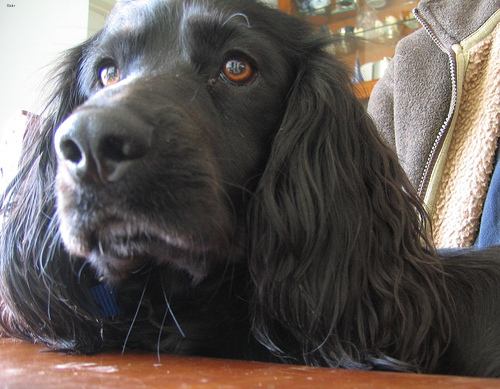

In [74]:
image = Image.open('./Oxford-IIIT/images/validation/english_cocker_spaniel_2.jpg')
image

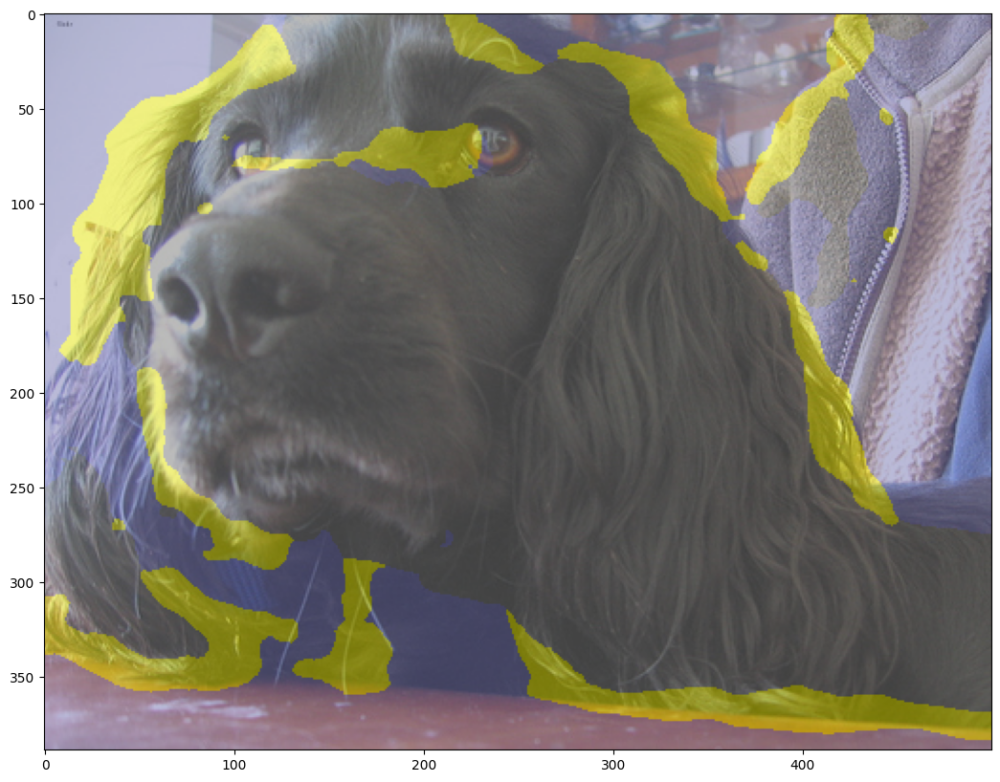

In [75]:
predicted_map, img = segment_image(image)

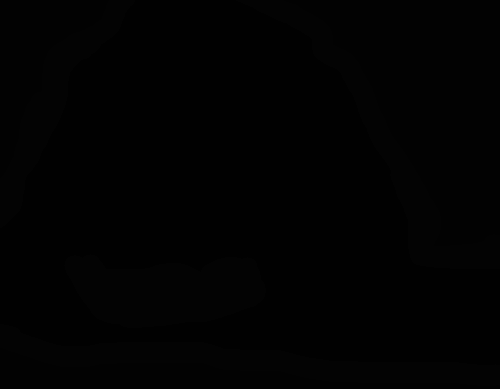

In [76]:
map = Image.open('./Oxford-IIIT/annotations/validation/english_cocker_spaniel_2.png')
map

Classes in this image: ['Foreground', 'Background', 'Not classified']


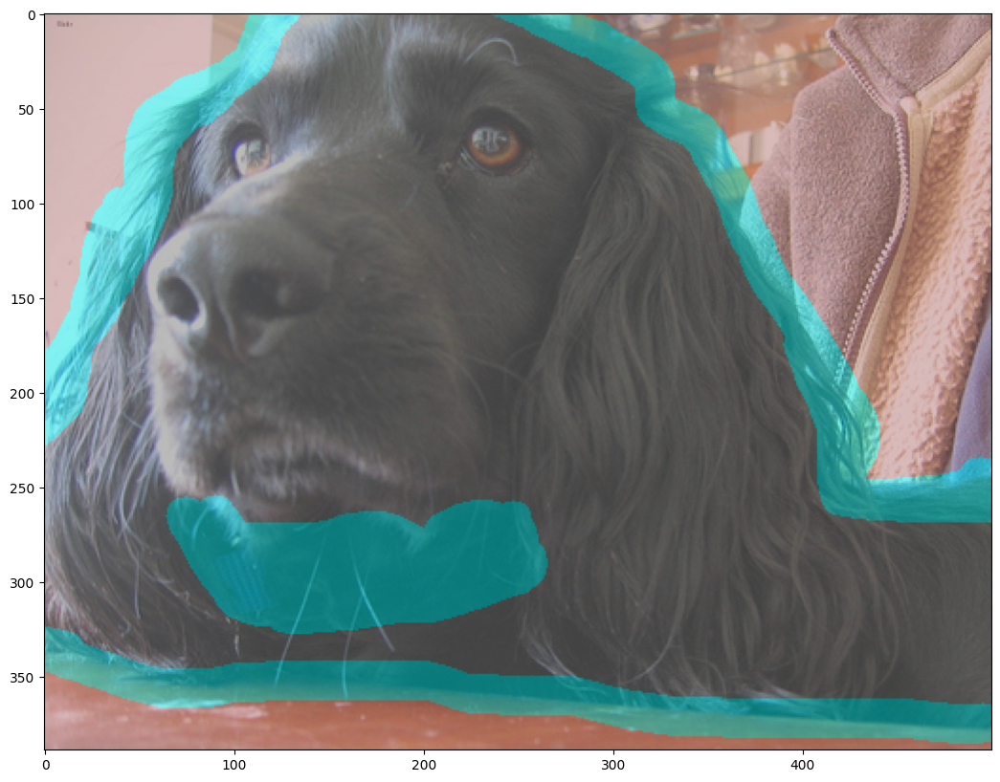

In [77]:
map = show_segment_label(map, img)

In [78]:
val_17_results = show_metrics(predicted_map, map)

mean_iou 0.577381899342862
mean_accuracy 0.728382771252248
overall_accuracy 0.7855012853470437


## New Dataset Test Image 2

In [67]:
print(random.randint(1,68))

14


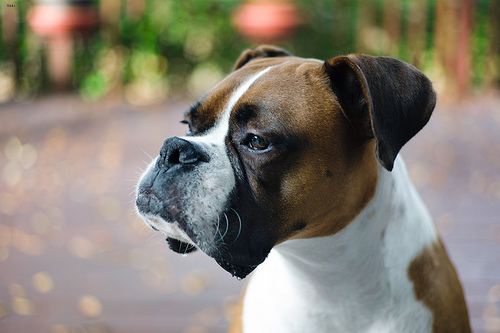

In [79]:
image = Image.open('./Oxford-IIIT/images/training/boxer_1.jpg')
image

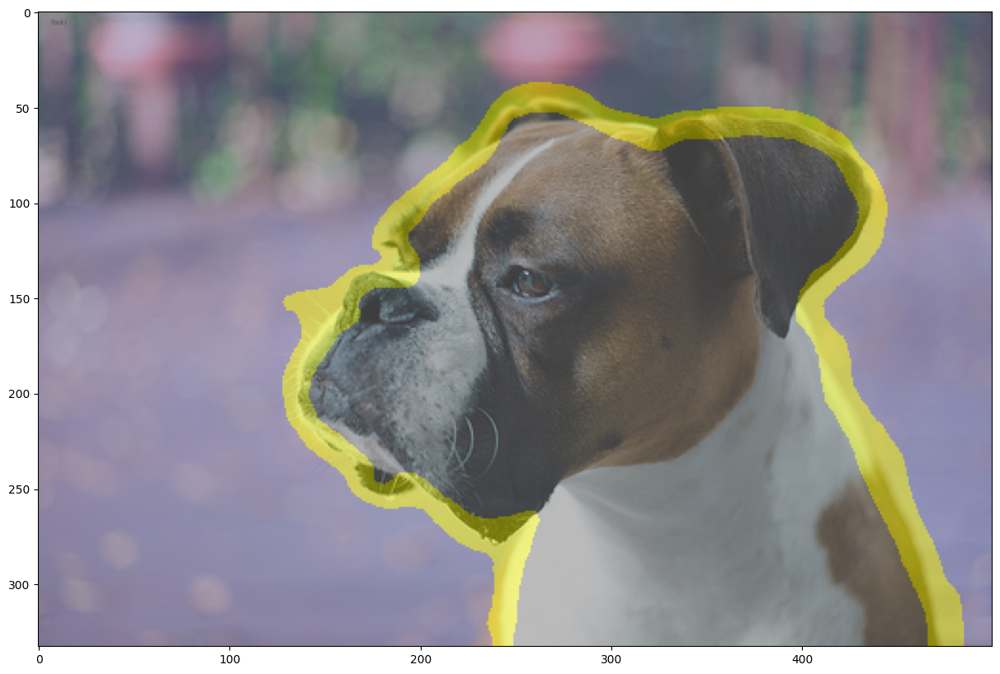

In [80]:
predicted_map, img = segment_image(image)

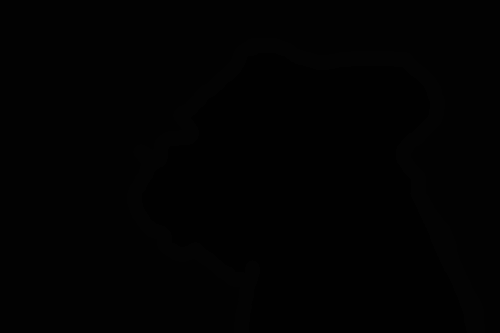

In [82]:
map = Image.open('./Oxford-IIIT/annotations/training/boxer_1.png')
map

Classes in this image: ['Foreground', 'Background', 'Not classified']


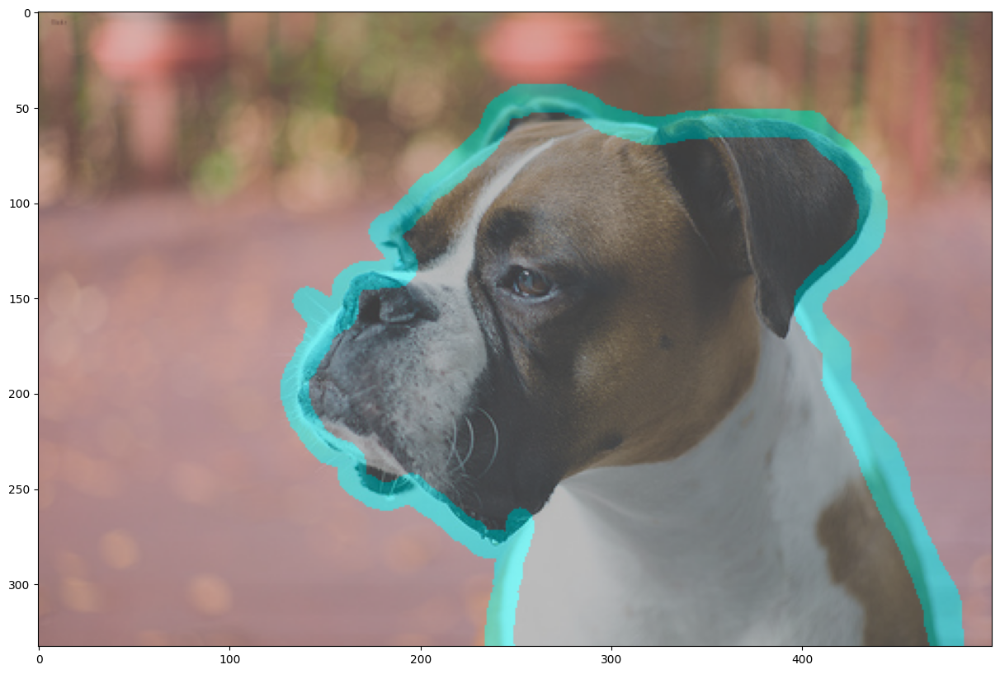

In [84]:
map = show_segment_label(map, img)

In [85]:
training_14_results = show_metrics(predicted_map, map)

mean_iou 0.9564299950217325
mean_accuracy 0.977396239712324
overall_accuracy 0.9900960960960961


## New Dataset Test Image 3

In [87]:
print(random.randint(1,68))

38


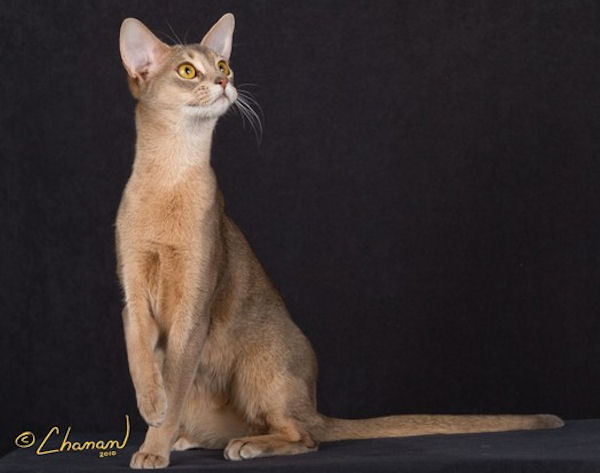

In [94]:
image = Image.open('./Oxford-IIIT/images/validation/Abyssinian_2.jpg')
image

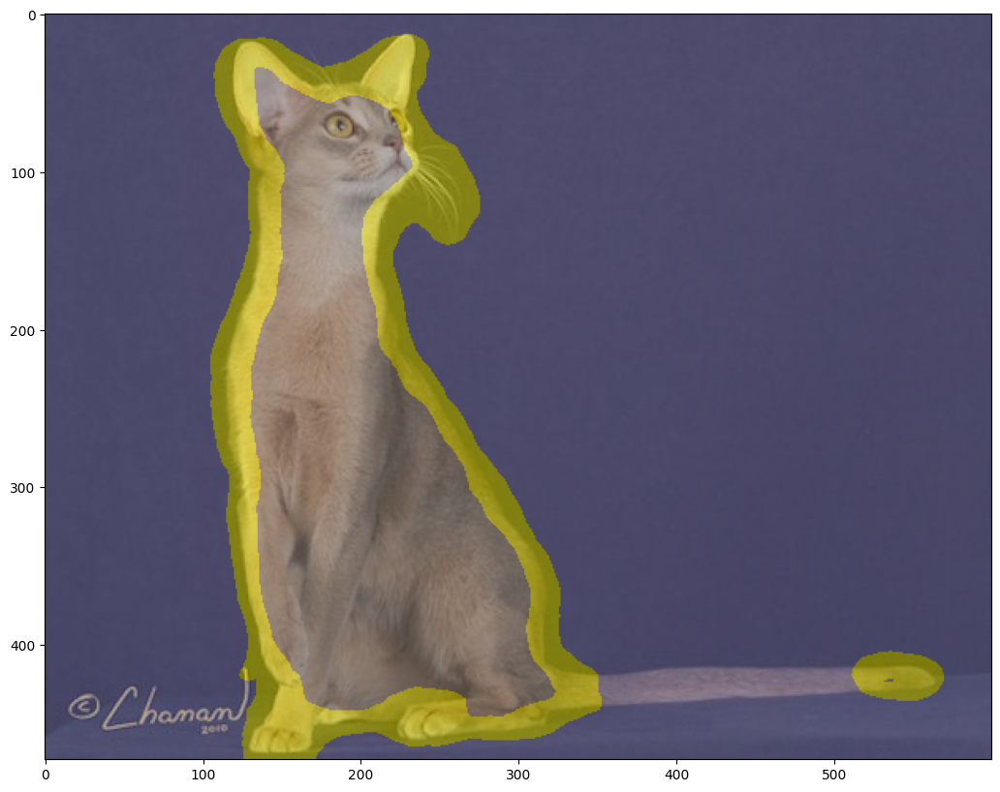

In [95]:
predicted_map, img = segment_image(image)

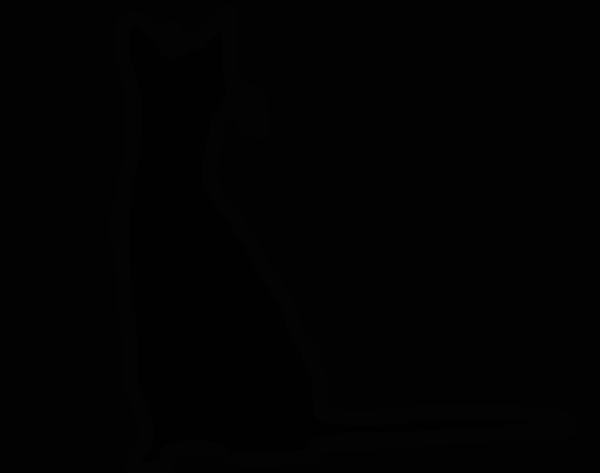

In [96]:
map = Image.open('./Oxford-IIIT/annotations/validation/Abyssinian_2.png')
map

Classes in this image: ['Foreground', 'Background', 'Not classified']


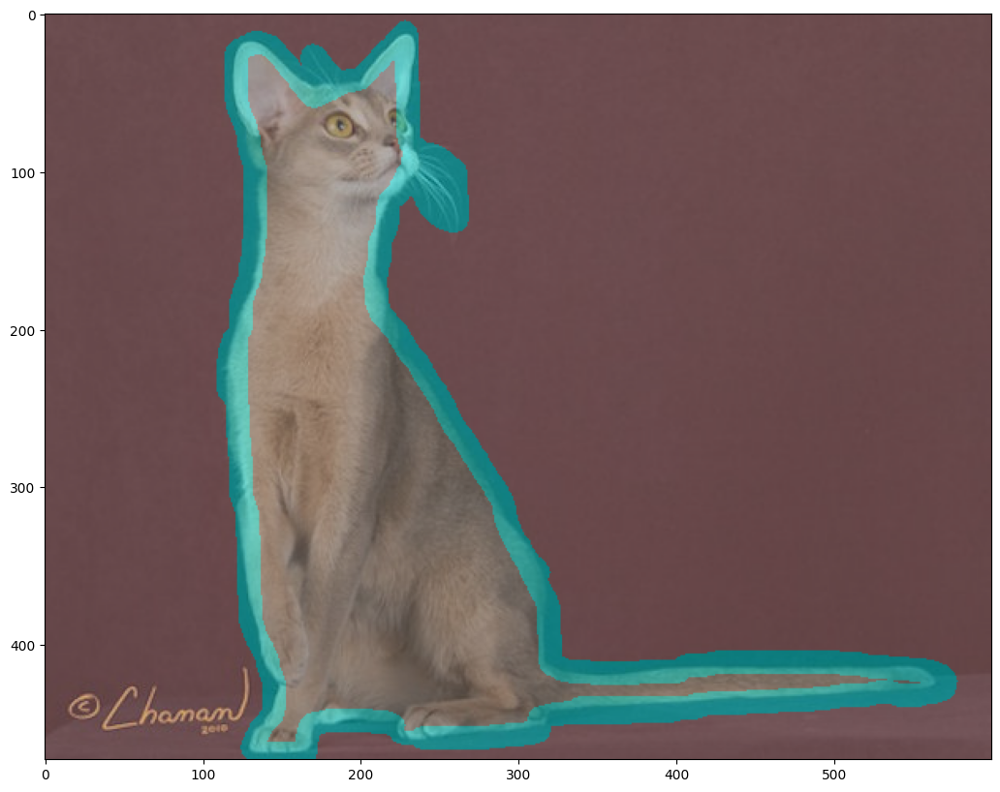

In [102]:
map = show_segment_label(map, img)

In [103]:
validation_1_results = show_metrics(predicted_map, map)

mean_iou 0.7772827867115001
mean_accuracy 0.8577107468644386
overall_accuracy 0.934492600422833
